<a href="https://colab.research.google.com/github/ayaemad10/detect-and-predict-of-the-space-debris/blob/main/Tensor_RT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# Access Google Drive Folder
import os
os.chdir("/content/drive/MyDrive")

In [ ]:
# Create YOLOv8 root folder
!mkdir yolov8-tensorrt

In [ ]:
# Go to YOLOv8 root folder
%cd yolov8-tensorrt

/content/drive/MyDrive/yolov8-tensorrt


In [ ]:
# Install YOLOv8
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.9/78.2 GB disk)


In [ ]:
#load model
from ultralytics import YOLO
model = YOLO("best.pt")

In [ ]:
#tensorrt
!pip install tensorrt

!pip install tensorrt_lean

!pip install tensorrt_dispatch

!pip install onnx onnxsim onnxruntime-gpu

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for tensorrt: filename=tensorrt-10.0.1-py2.py3-none-any.whl size=16331 sha256=0fd7cd2add4258c7e868b394c252016174adc61d0efc4e4b2818532270176e1c
  Stored in directory: /root/.cache/pip/wheels/43/0e/35/f5de9a100ae769ece311b8f653e493f7e49bbcc25dcdc92e27
  Created wheel for tensorrt-cu12: filename=tensorrt_cu12-10.0.1-py2.py3-none-any.whl size=17551 sha256=4ef465423c4ae33fbd1dd5bd1cae83cf76784847ad92b97752b6244a0402695a
  Stored in directory: /root/.cache/pip/wheels/3d/65/7d/75f1bf55d7e57b0c82cb037d1d39d53851946315222eaf4c76
Successfully built tensorrt tensorrt-cu12
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
  Created wheel for tensorrt_lean: filename=tensorrt_lean-10.0.1-py2.py3-none-any.whl size=16401 sha256=cac1621cd9d6f303901068d9af11318e424f21e2c78d38c6605b30f329aaae0a
  Stored in directory: /root/.cache/pip/wheels/22/cc/32/7b2dfc147ecd50018b8fd75a2ad

In [ ]:
import tensorrt
print(tensorrt.__version__)
assert tensorrt.Builder(tensorrt.Logger())

10.0.1


In [ ]:
# Export YOLOv8 Model to Tensorrt
!yolo export model=best.pt format=engine half=True device=0 workspace=12

Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25841497 parameters, 0 gradients, 78.7 GFLOPs

PyTorch: starting from 'best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 7, 8400) (49.6 MB)

ONNX: starting export with onnx 1.16.0 opset 17...
ONNX: simplifying with onnxsim 0.4.36...
ONNX: export success ✅ 5.5s, saved as 'best.onnx' (98.7 MB)

TensorRT: starting export with TensorRT 10.0.1...
[05/21/2024-22:15:14] [TRT] [I] [MemUsageChange] Init CUDA: CPU +1, GPU +0, now: CPU 693, GPU 801 (MiB)
[05/21/2024-22:15:15] [TRT] [I] [MemUsageChange] Init builder kernel library: CPU +945, GPU +178, now: CPU 1774, GPU 979 (MiB)
[05/21/2024-22:15:16] [TRT] [I] ----------------------------------------------------------------
[05/21/2024-22:15:16] [TRT] [I] Input filename:   best.onnx
[05/21/2024-22:15:16] [TRT] [I] ONNX IR version:  0.0.8
[05/21/2024-22:15:16] [TRT] [I] Opset version:    17
[05/21/2024-22:

In [ ]:
# Inference Using YOLOv8 Model
!yolo detect predict model=best.pt source="a.jpg" device=0

Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 218 layers, 25841497 parameters, 0 gradients, 78.7 GFLOPs

image 1/1 /content/drive/MyDrive/yolov8-tensorrt/a.jpg: 544x640 1 1U, 72.3ms
Speed: 16.3ms preprocess, 72.3ms inference, 1819.1ms postprocess per image at shape (1, 3, 544, 640)
Results saved to runs/detect/predict
💡 Learn more at https://docs.ultralytics.com/modes/predict


In [ ]:
# Inference Using YOLOv8 Tensorrt
!yolo detect predict model=best.engine source="a.jpg" device=0

Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Loading best.engine for TensorRT inference...
[05/21/2024-22:22:55] [TRT] [I] Loaded engine size: 51 MiB
[05/21/2024-22:22:55] [TRT] [I] [MemUsageChange] TensorRT-managed allocation in IExecutionContext creation: CPU +0, GPU +30, now: CPU 0, GPU 80 (MiB)

image 1/1 /content/drive/MyDrive/yolov8-tensorrt/a.jpg: 640x640 1 1U, 11.0ms
Speed: 32.3ms preprocess, 11.0ms inference, 2231.2ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict2
💡 Learn more at https://docs.ultralytics.com/modes/predict


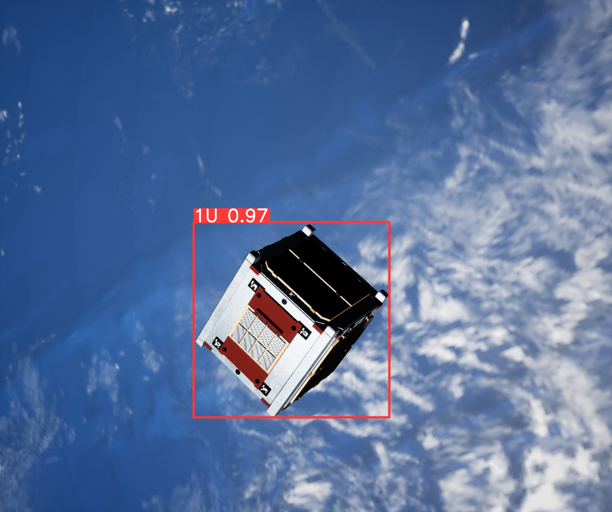

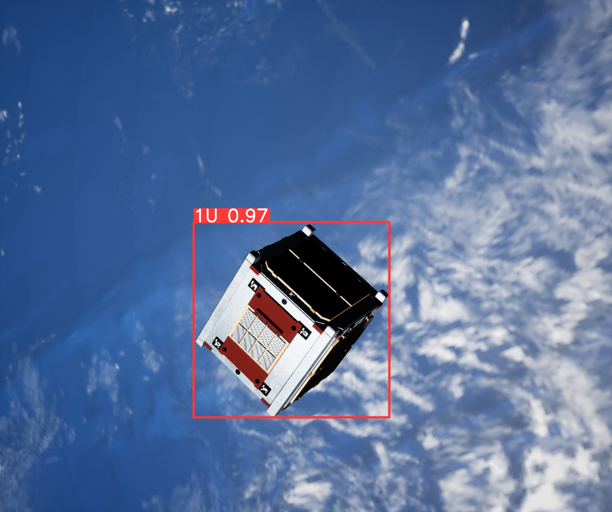

In [ ]:
#show image in colab
from PIL import Image
from IPython.display import display

# Load the images
image1 = Image.open("/content/drive/MyDrive/yolov8-tensorrt/runs/detect/predict/a.jpg")
image2 = Image.open("/content/drive/MyDrive/yolov8-tensorrt/runs/detect/predict2/a.jpg")

w, h = image1.size
new_width = int(w/4)
new_height = int(h/4)

# Resize the images
image1 = image1.resize((new_width, new_height))
image2 = image2.resize((new_width, new_height))

# Display the images side by side
display(image1, image2)

In [ ]:
#inference on video
# Download modules
!gdown https://drive.google.com/uc?id=1RskX1wXVF0xSMAPgpkU-EsaUv8tD7lvS

Downloading...
From: https://drive.google.com/uc?id=1RskX1wXVF0xSMAPgpkU-EsaUv8tD7lvS
To: /content/drive/MyDrive/yolov8-tensorrt/modules.zip
100% 5.39k/5.39k [00:00<00:00, 25.2MB/s]


In [ ]:
# Unzip the modules
!unzip modules.zip

Archive:  modules.zip
  inflating: modules/autobackend.py  
  inflating: modules/utils.py        


In [ ]:
# Create inference folder
!mkdir inference

In [ ]:
import torch
import cv2
import random
import time
import pathlib
from ultralytics import YOLO

In [ ]:
import modules.utils as utils
from modules.autobackend import AutoBackend

In [ ]:
def tensorrt_detection(model, source, image):
    # Preprocess
    im = utils.preprocess(image)

    # Inference
    preds = model(im)

    # Post Process
    results = utils.postprocess(preds, im, image, model.names, source)
    d = results[0].boxes

    # Get information from result
    tensor_size = d.cls.size()[0]
    if(tensor_size > 1):
        cls, conf, box = d.cls.squeeze(), d.conf.squeeze(), d.xyxy.squeeze()
    else:
        cls, conf, box = d.cls, d.conf, d.xyxy

    return cls, conf, box


In [ ]:
import cv2
from pathlib import Path
from ultralytics import YOLO

def load_model(model_path):
    # تحميل النموذج المدرب مسبقًا باستخدام YOLOv8
    model = YOLO(model_path)
    return model

def detect_objects(model, source, name):
    # إذا كان المصدر فيديو
    if source.endswith(('mp4', 'avi', 'mov')):
        cap = cv2.VideoCapture(source)
        frame_width = int(cap.get(3))
        frame_height = int(cap.get(4))
        out = cv2.VideoWriter(f"{name}/output.avi", cv2.VideoWriter_fourcc(*'XVID'), 10, (frame_width, frame_height))

        while True:
            ret, frame = cap.read()
            if not ret:
                break
            results = model(frame)
            result_frame = results[0].plot()  # إعادة صياغة النتائج باستخدام plot()
            out.write(result_frame)

        cap.release()
        out.release()
        print(f"النتائج تم حفظها في الملف: {name}/output.avi")

if __name__ == "__main__":
    model_path = '/content/drive/MyDrive/yolov8-tensorrt/best.engine'  # مسار النموذج المدرب مسبقًا
    source = '/content/drive/MyDrive/yolov8-tensorrt/inference/test.mp4'  # مسار الفيديو
    name = 'video'  # اسم المجلد أو الملف الناتج

    model = load_model(model_path)
    detect_objects(model, source, name)


Streaming output truncated to the last 5000 lines.
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.5ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.2ms
Speed: 2.3ms preprocess, 11.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640

WARNING ⚠️ Unable to automatically guess model task, assuming 'task=detect'. Explicitly define task for your model, i.e. 'task=detect', 'segment', 'classify','pose' or 'obb'.
Loading /content/drive/MyDrive/yolov8-tensorrt/best.engine for TensorRT inference...

0: 640x640 1 3U, 11.0ms
Speed: 2.8ms preprocess, 11.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)


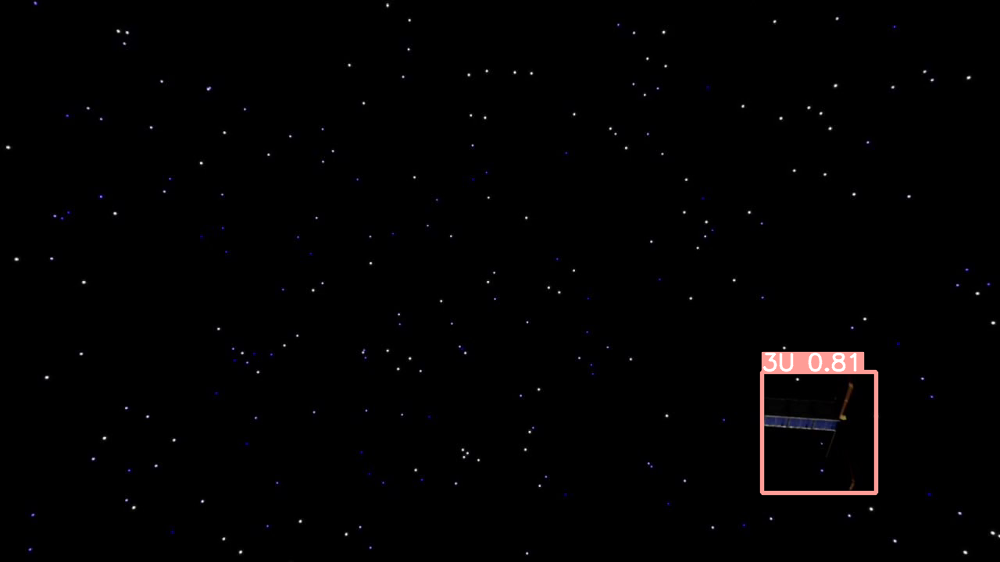


0: 640x640 1 3U, 11.0ms
Speed: 2.7ms preprocess, 11.0ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.0ms
Speed: 2.3ms preprocess, 11.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.0ms
Speed: 2.4ms preprocess, 11.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.1ms
Speed: 2.4ms preprocess, 11.1ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.0ms
Speed: 2.6ms preprocess, 11.0ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.9ms
Speed: 2.2ms preprocess, 10.9ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.9ms
Speed: 2.4ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.0ms

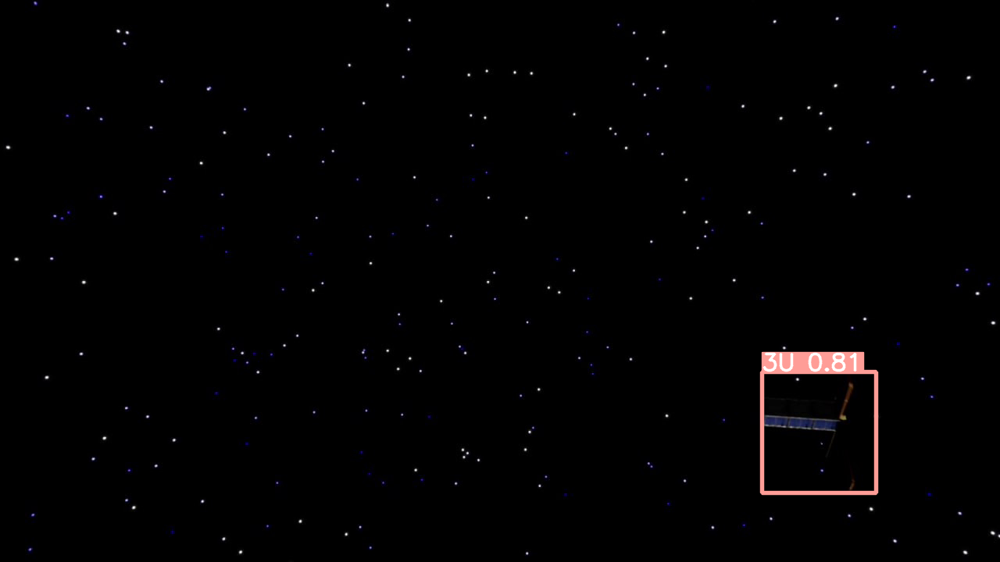


0: 640x640 1 3U, 9.4ms
Speed: 2.6ms preprocess, 9.4ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.1ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.1ms preprocess, 9.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.3ms pre

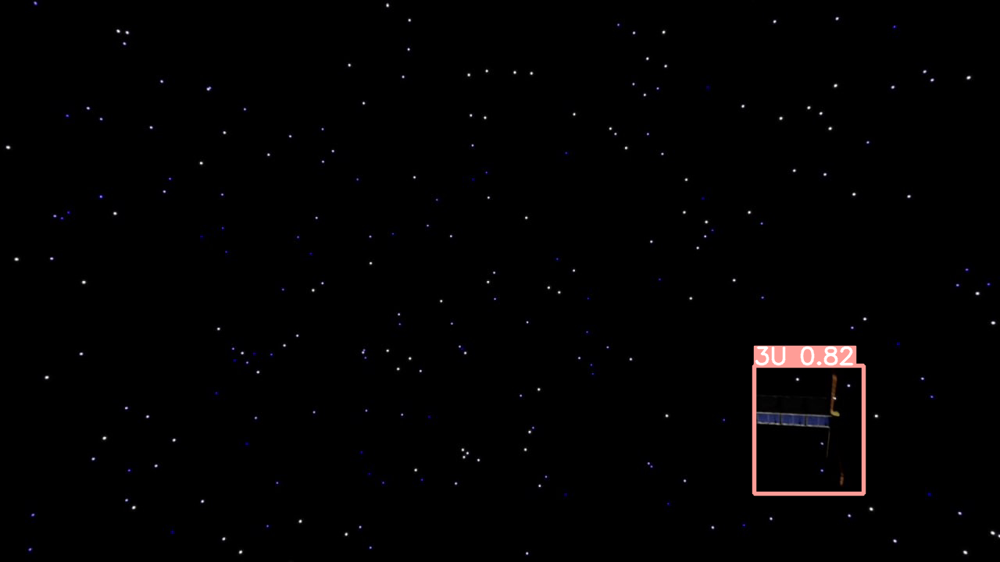


0: 640x640 1 3U, 8.3ms
Speed: 4.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.6ms pre

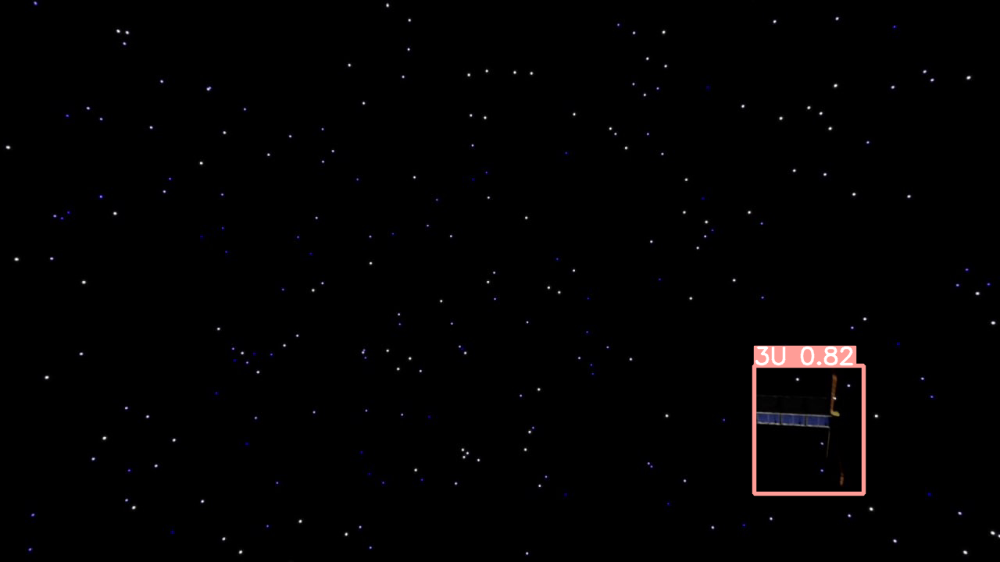


0: 640x640 1 3U, 8.4ms
Speed: 3.6ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.2ms
Speed: 3.0ms preprocess, 10.2ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 3.0ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.5ms p

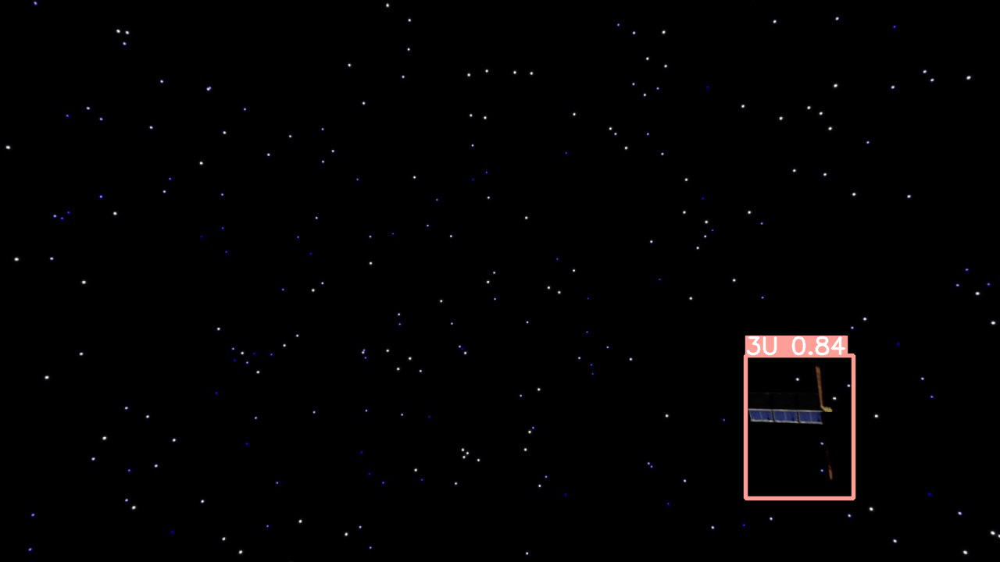


0: 640x640 1 3U, 8.3ms
Speed: 2.5ms preprocess, 8.3ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.6ms preprocess, 9.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.8ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.8ms preprocess, 9.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.7ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.1ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.4ms preprocess, 9.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.6ms pre

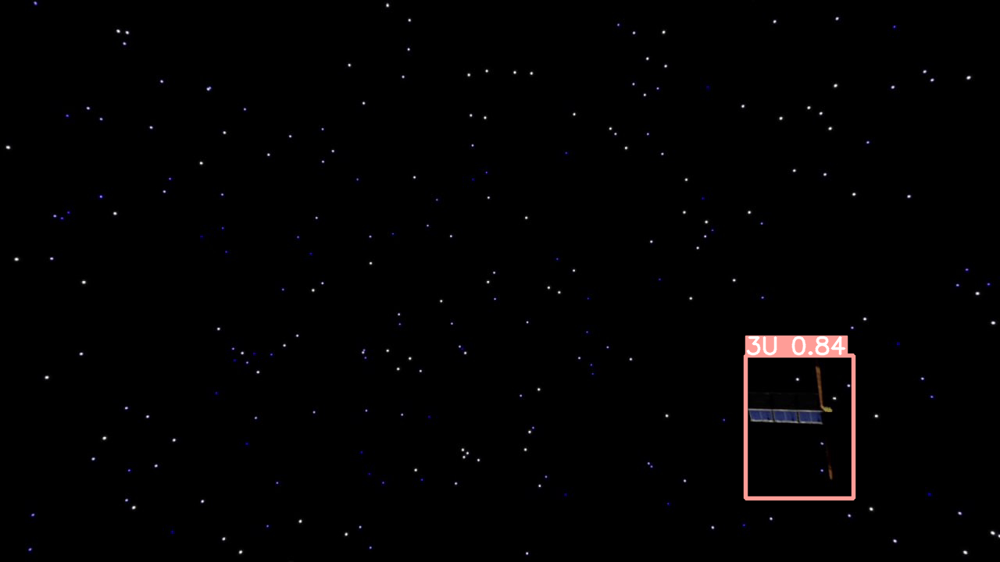


0: 640x640 1 3U, 8.5ms
Speed: 2.6ms preprocess, 8.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.1ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 4.6ms preprocess, 8.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.3ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms pre

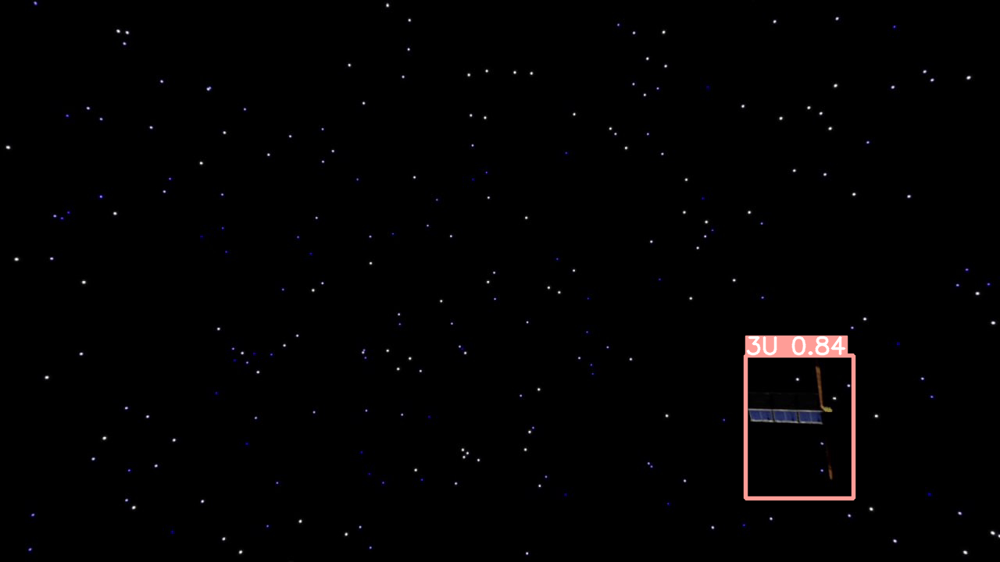


0: 640x640 1 3U, 8.4ms
Speed: 2.7ms preprocess, 8.4ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.4ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.1ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.1ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.3ms pre

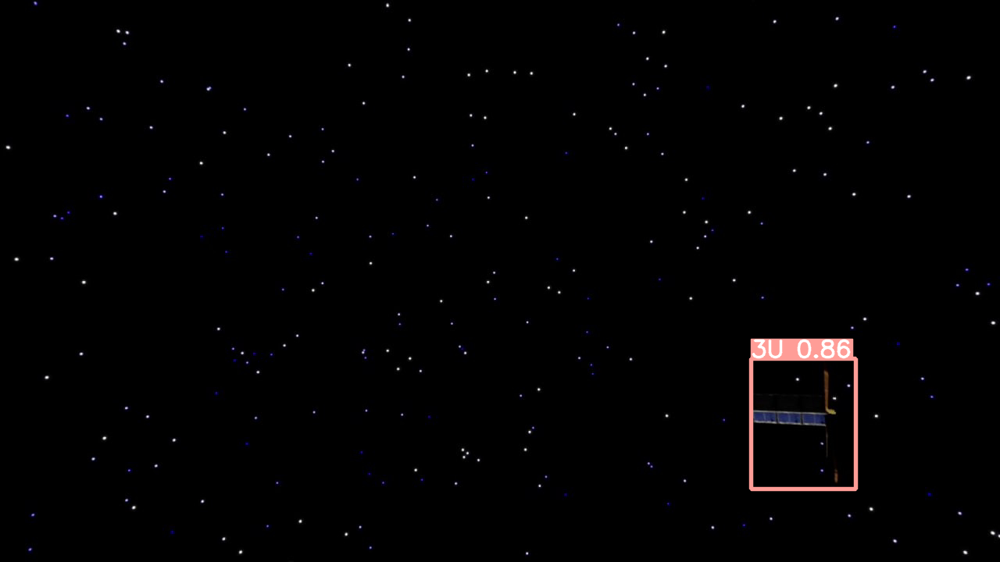


0: 640x640 1 3U, 8.0ms
Speed: 2.7ms preprocess, 8.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 3.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 3.9ms preprocess, 7.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.9ms
Speed: 6.2ms preprocess, 10.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 4.4ms preprocess, 7.9ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.4ms
Speed: 2.4ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 4.5ms p

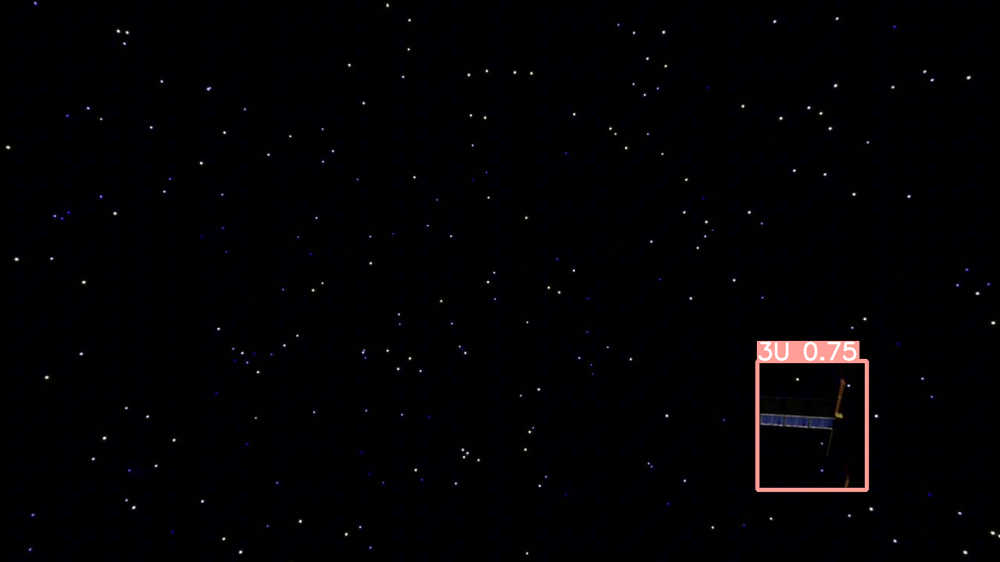


0: 640x640 1 3U, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 4.1ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms pre

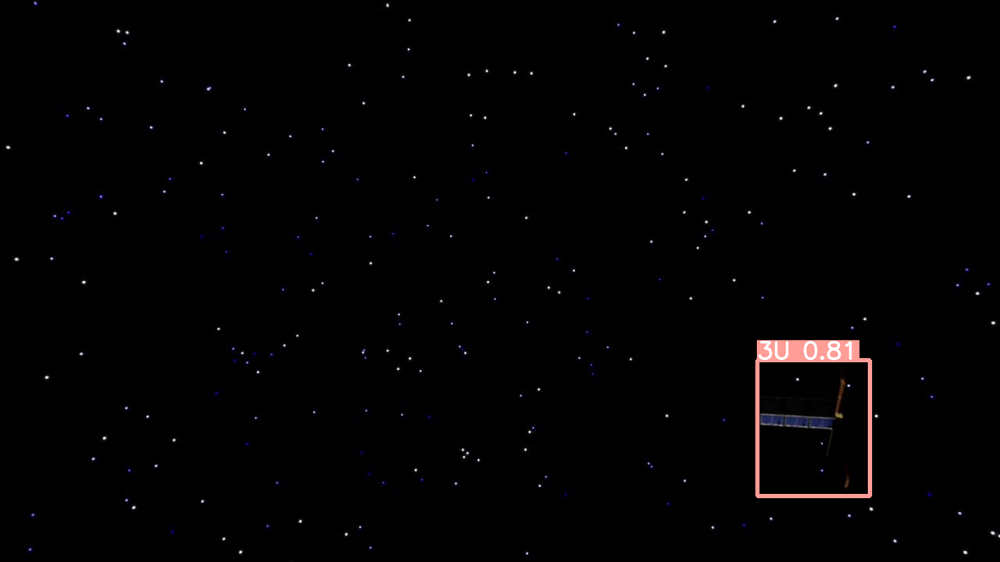


0: 640x640 1 3U, 8.5ms
Speed: 2.7ms preprocess, 8.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms pre

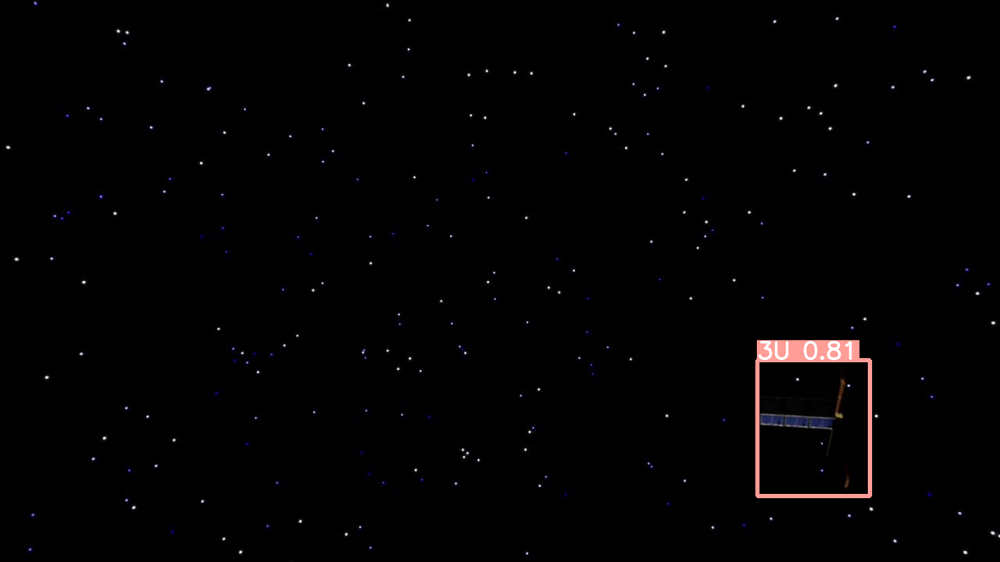


0: 640x640 1 3U, 8.0ms
Speed: 4.3ms preprocess, 8.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.8ms preprocess, 8.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.4ms pre

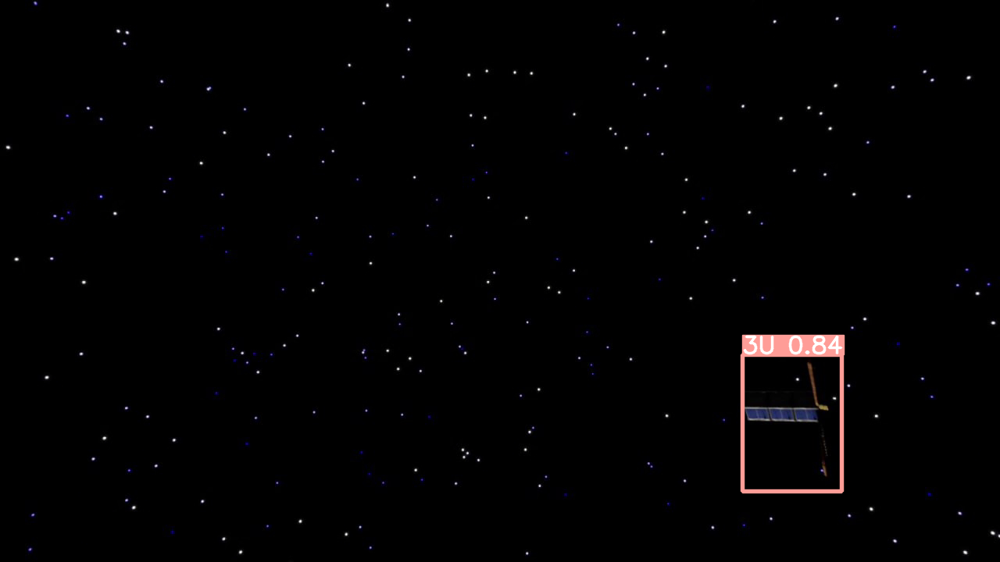


0: 640x640 1 3U, 8.0ms
Speed: 3.2ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.6ms pre

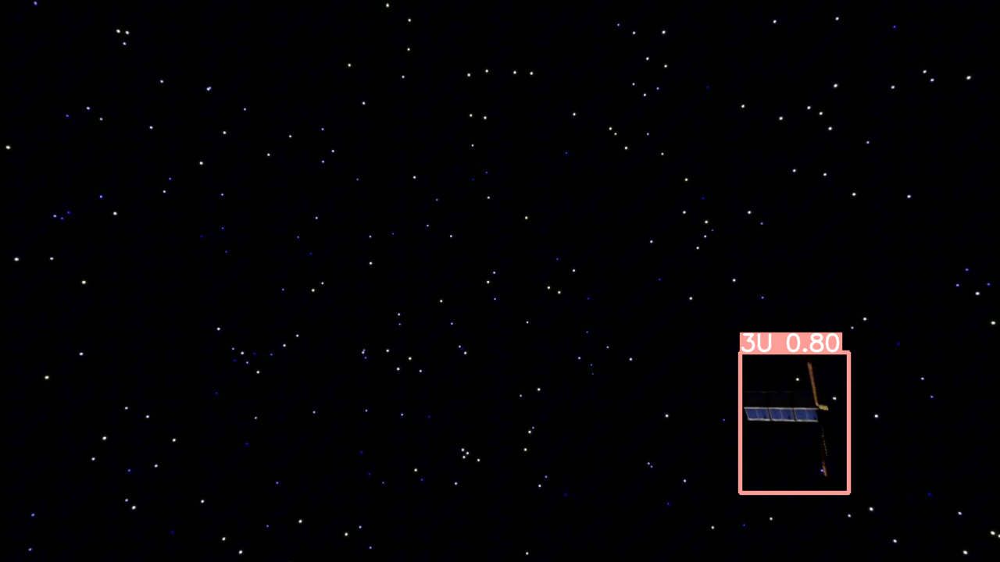


0: 640x640 1 3U, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.8ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.9ms
Speed: 2.1ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms pre

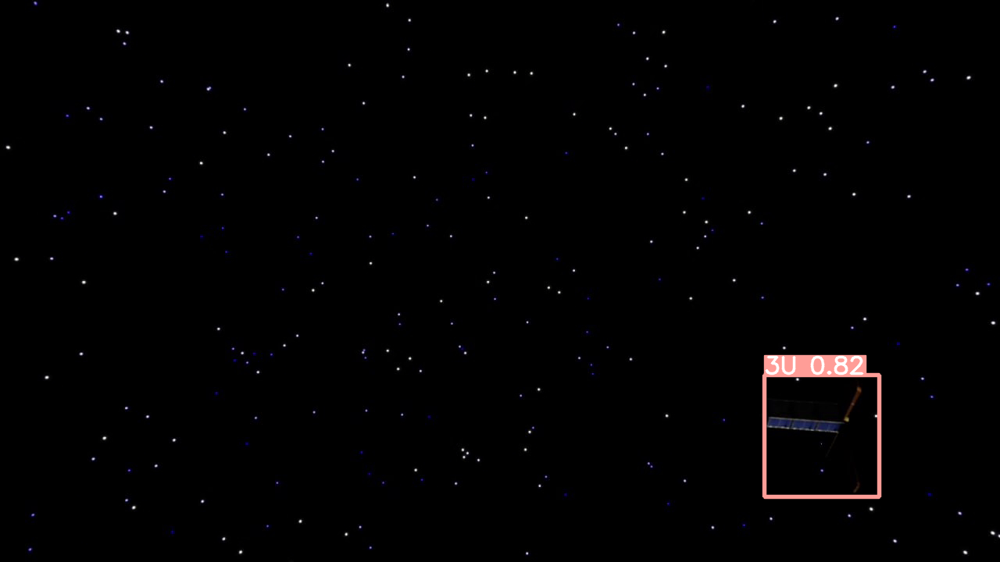


0: 640x640 1 3U, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.5ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.4ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms pre

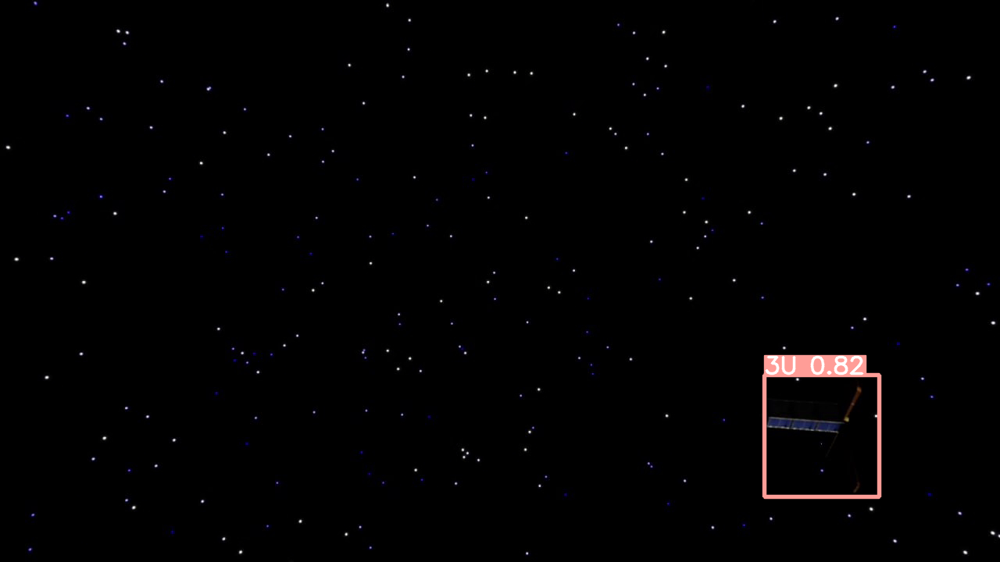


0: 640x640 1 3U, 8.2ms
Speed: 2.7ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 4.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.1ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.1ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.1ms pre

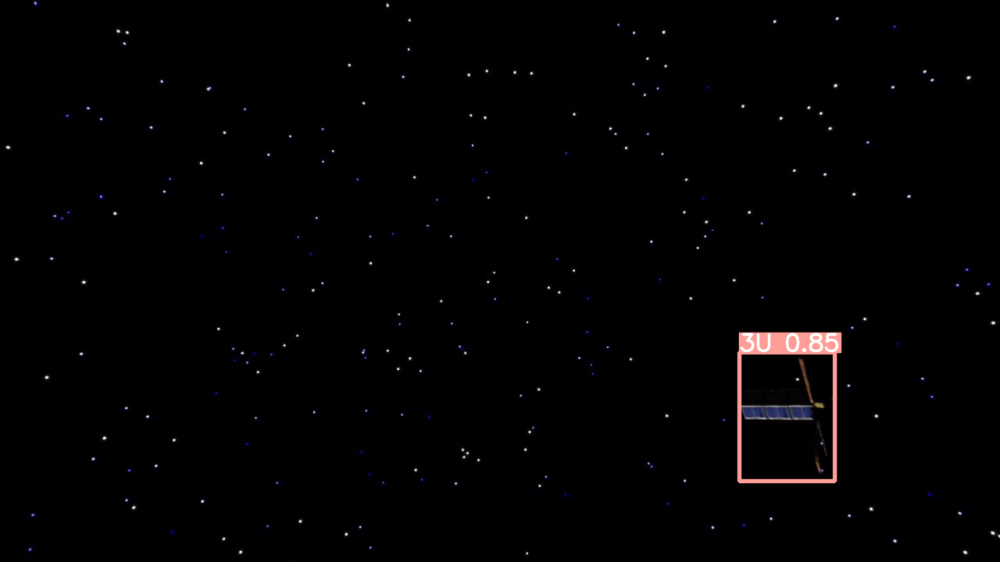


0: 640x640 1 3U, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.0ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms pre

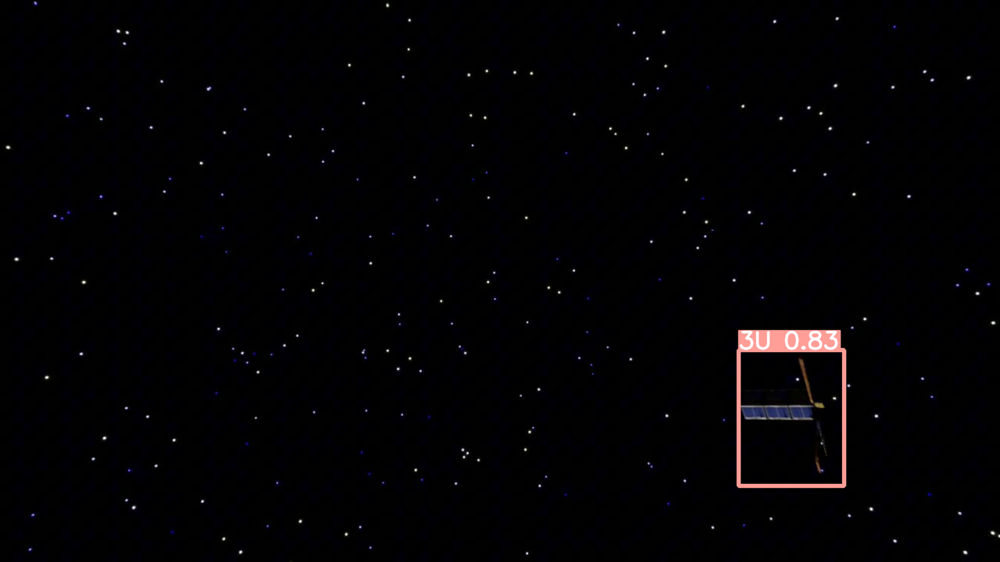


0: 640x640 1 3U, 7.9ms
Speed: 3.0ms preprocess, 7.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.1ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.4ms pre

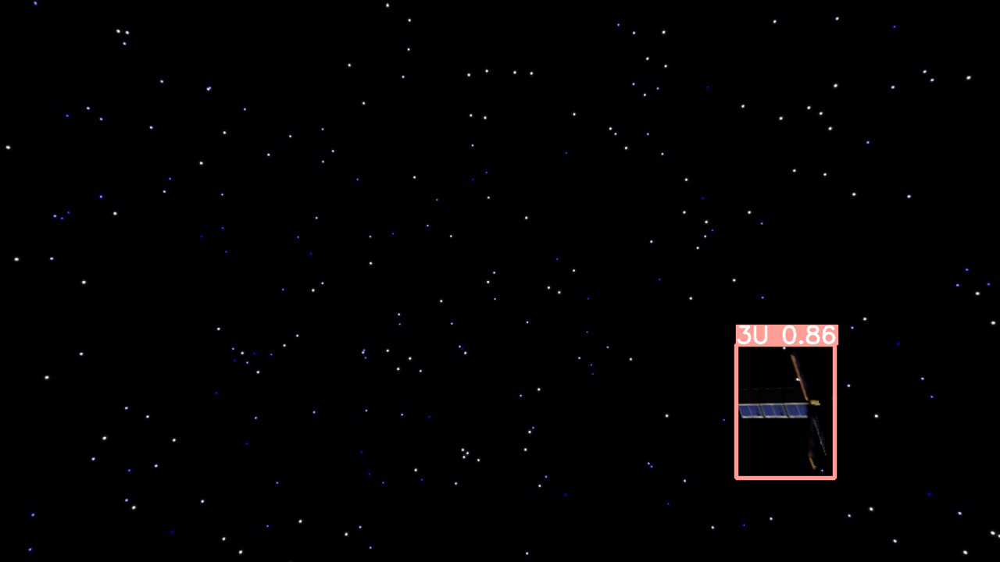


0: 640x640 1 3U, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 4.1ms preprocess, 7.8ms inference, 5.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.5ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.1ms pre

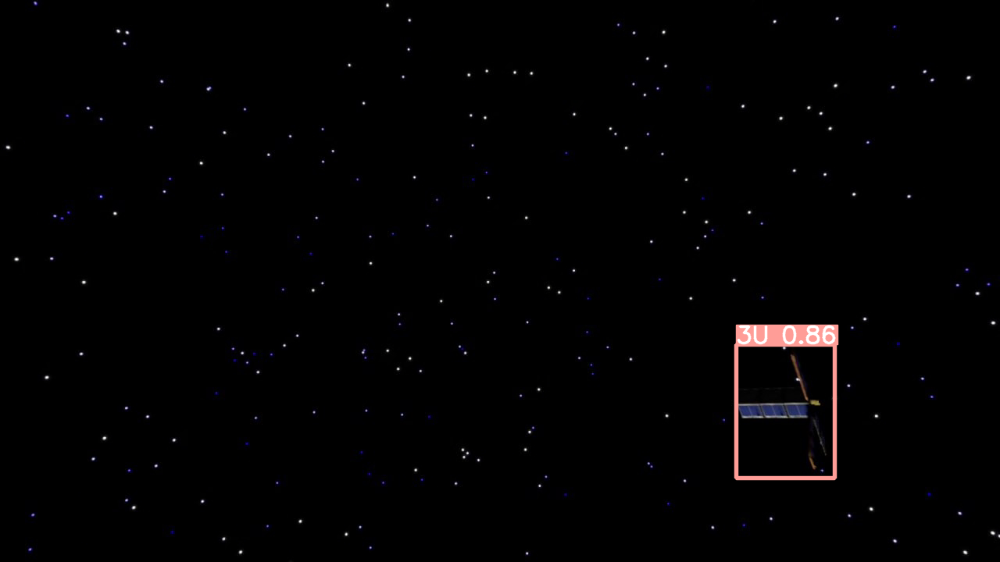


0: 640x640 1 3U, 9.7ms
Speed: 2.9ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 3.5ms preprocess, 9.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.9ms
Speed: 2.2ms preprocess, 8.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.4ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.6ms
Speed: 2.8ms preprocess, 10.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.8ms preprocess, 7.7ms inference, 7.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.5ms
Speed: 4.8ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.8ms
Speed: 2.7ms preprocess, 11.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.8ms
Speed: 

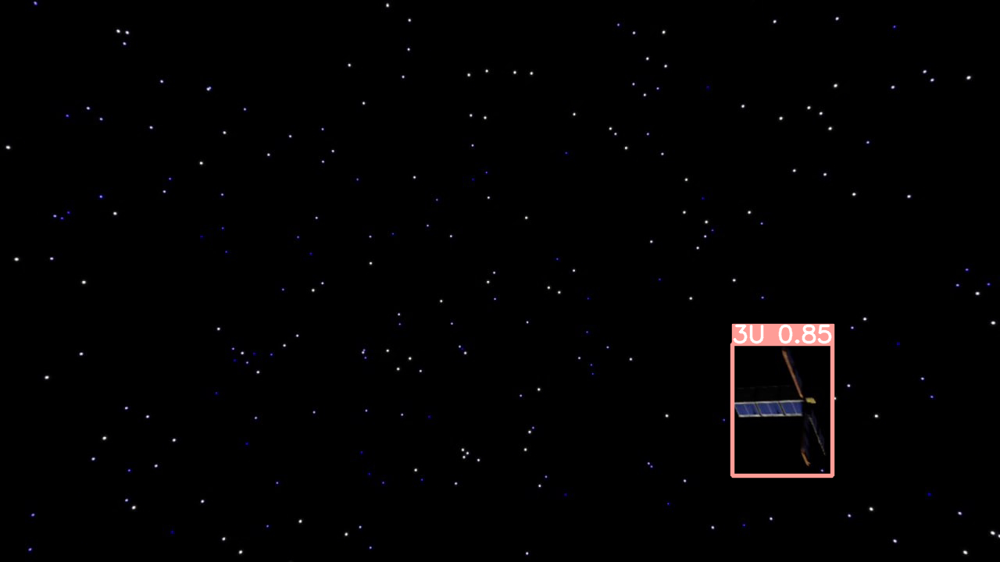


0: 640x640 1 3U, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.0ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.0ms pre

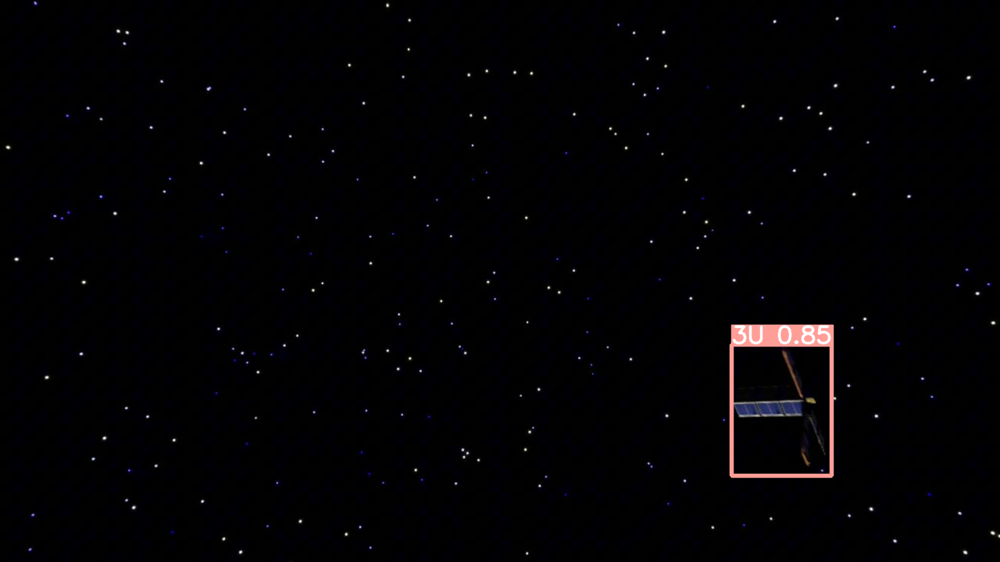


0: 640x640 1 3U, 8.9ms
Speed: 2.8ms preprocess, 8.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.9ms
Speed: 2.4ms preprocess, 8.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.3ms pre

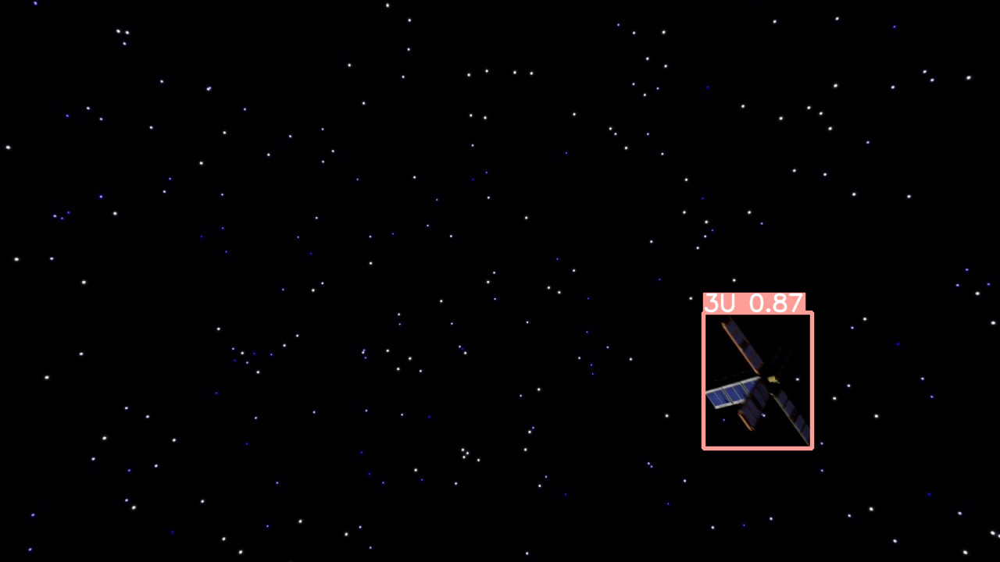


0: 640x640 1 3U, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.2ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms

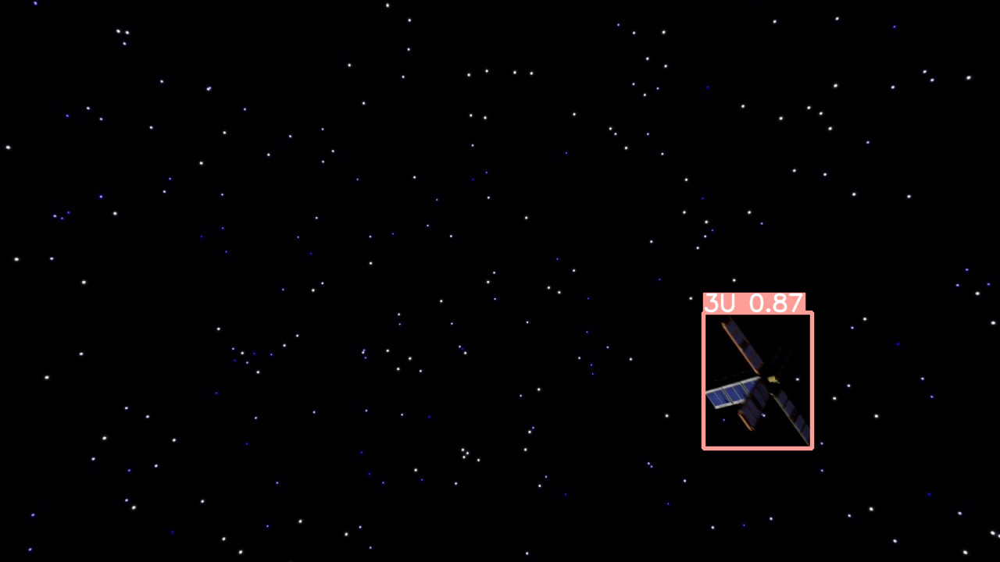


0: 640x640 1 3U, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 3.7ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.5ms
Speed: 2.6ms pr

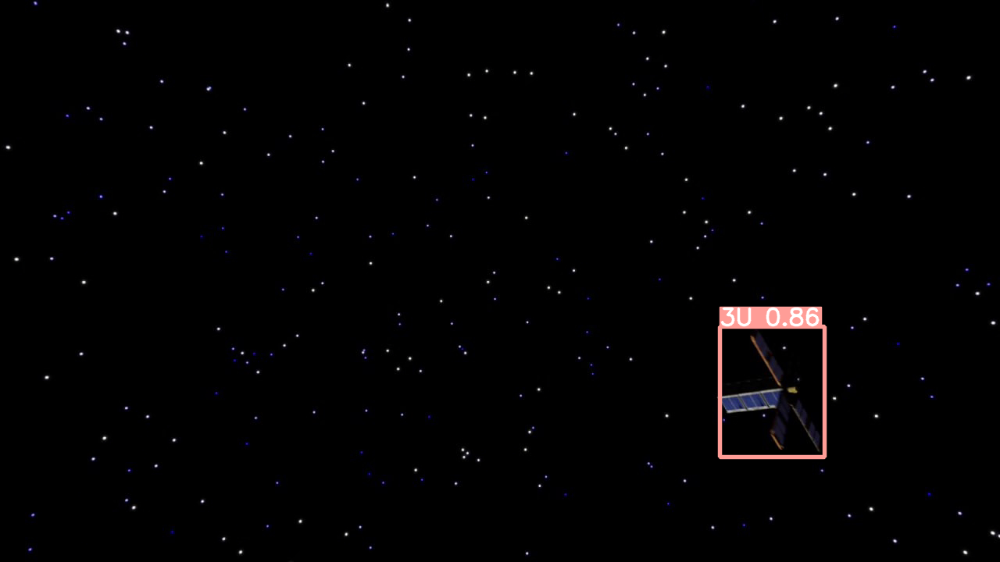


0: 640x640 1 3U, 8.2ms
Speed: 2.6ms preprocess, 8.2ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms pre

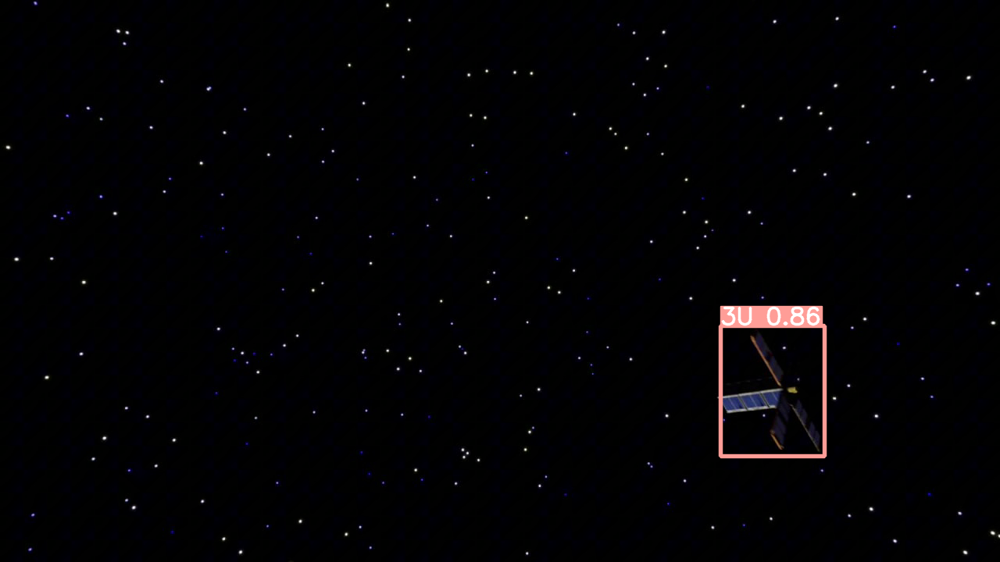


0: 640x640 1 3U, 8.0ms
Speed: 5.9ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.7ms pre

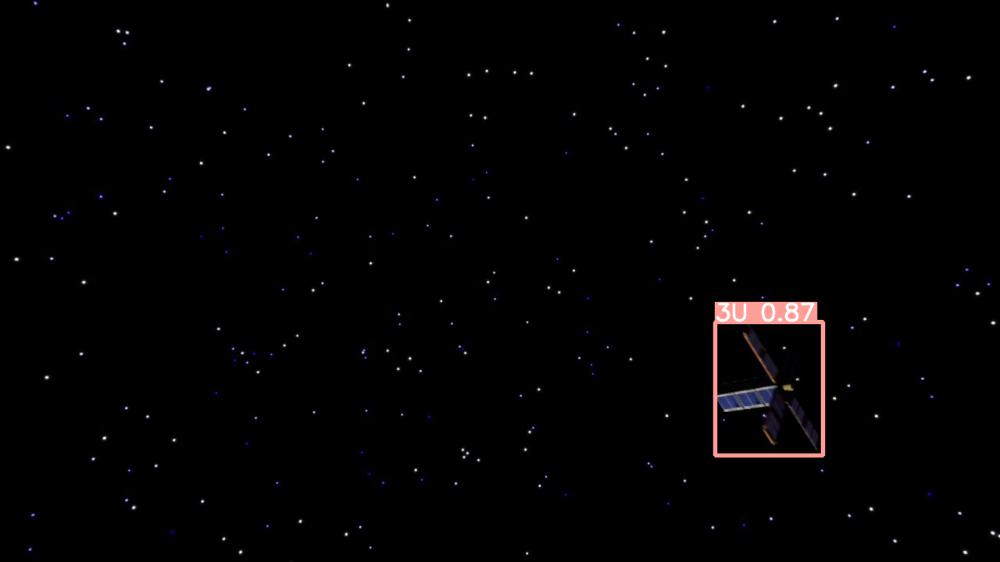


0: 640x640 1 3U, 8.0ms
Speed: 2.7ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms pre

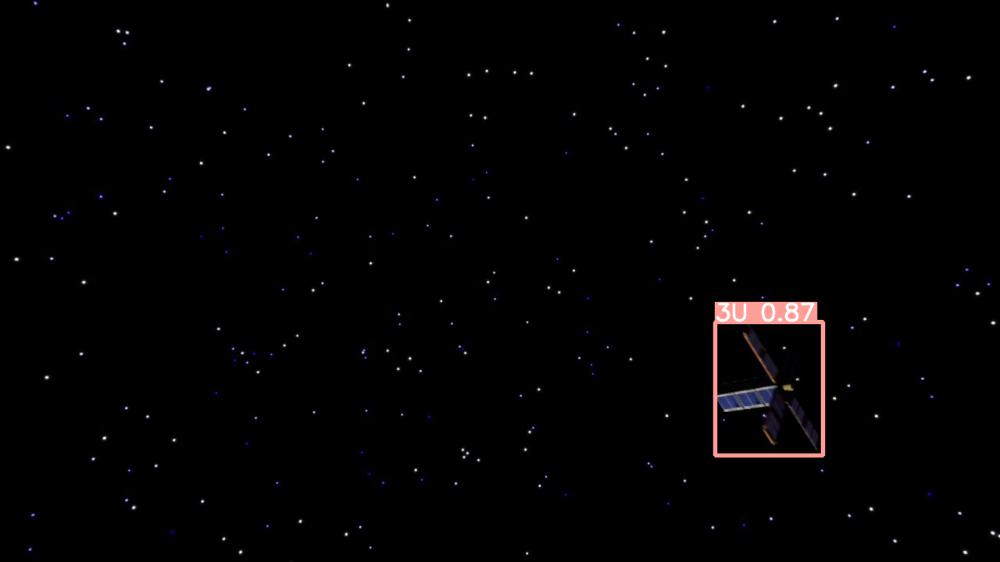


0: 640x640 1 3U, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 4.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 4.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.1ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 4.8ms pre

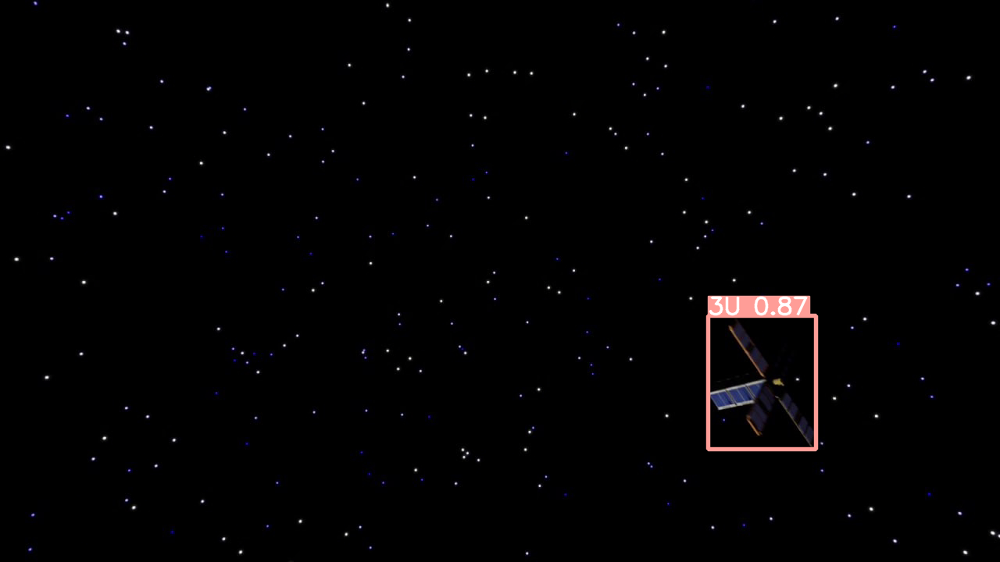


0: 640x640 1 3U, 8.2ms
Speed: 3.1ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.5ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.4ms pre

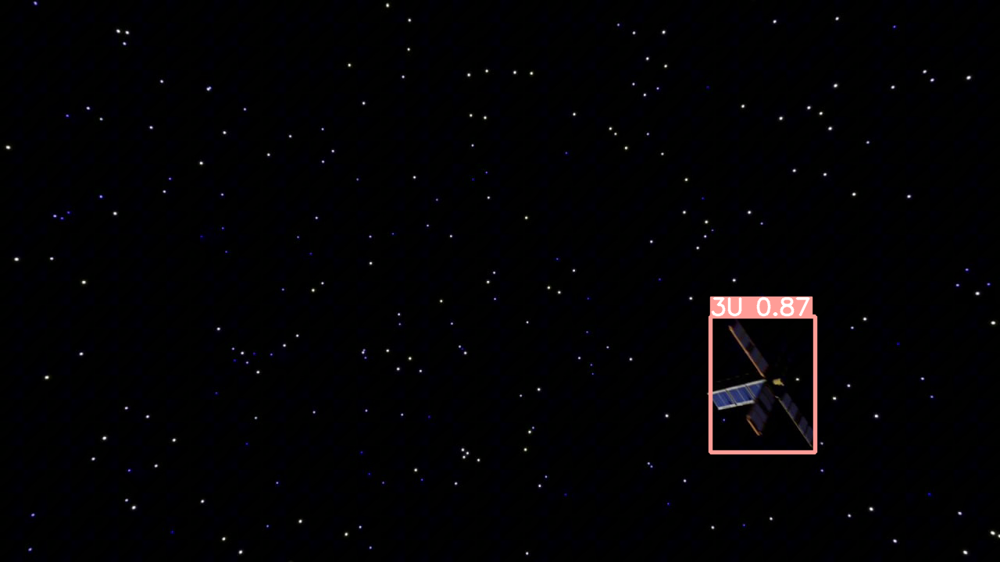


0: 640x640 1 3U, 8.1ms
Speed: 2.9ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms pre

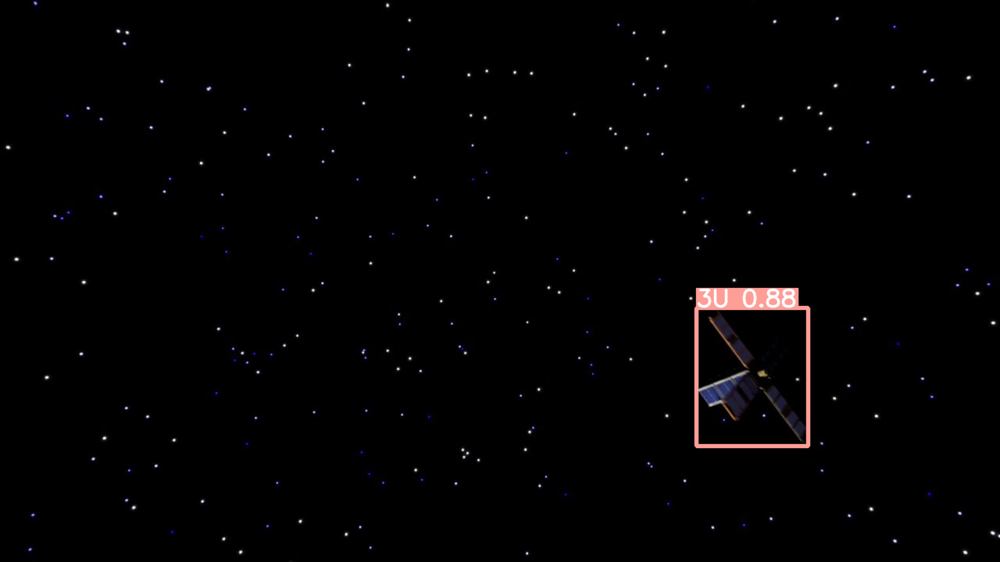


0: 640x640 1 3U, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms pre

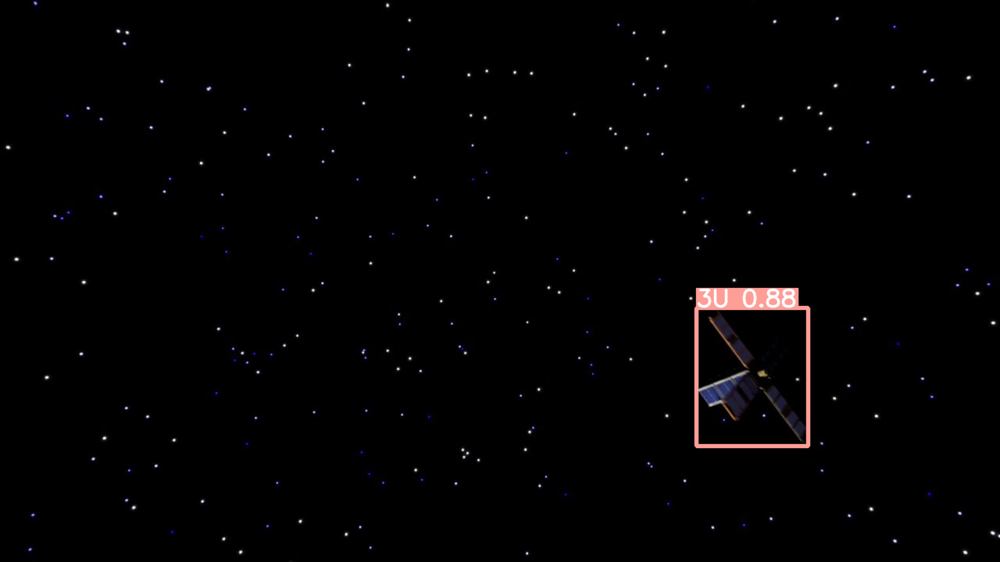


0: 640x640 1 3U, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 6.0ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.3ms pre

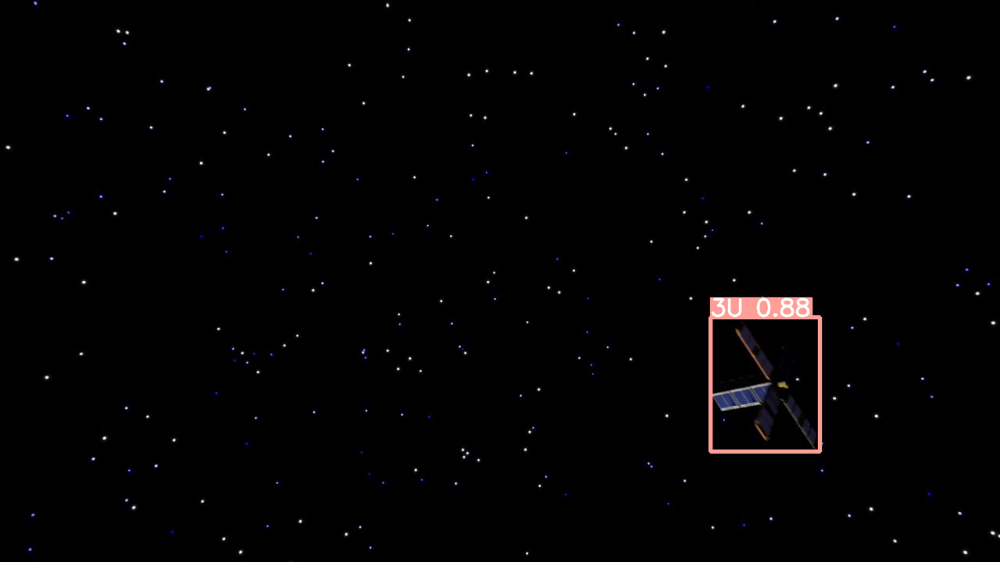


0: 640x640 1 3U, 7.8ms
Speed: 2.7ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 7.5ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.1ms pre

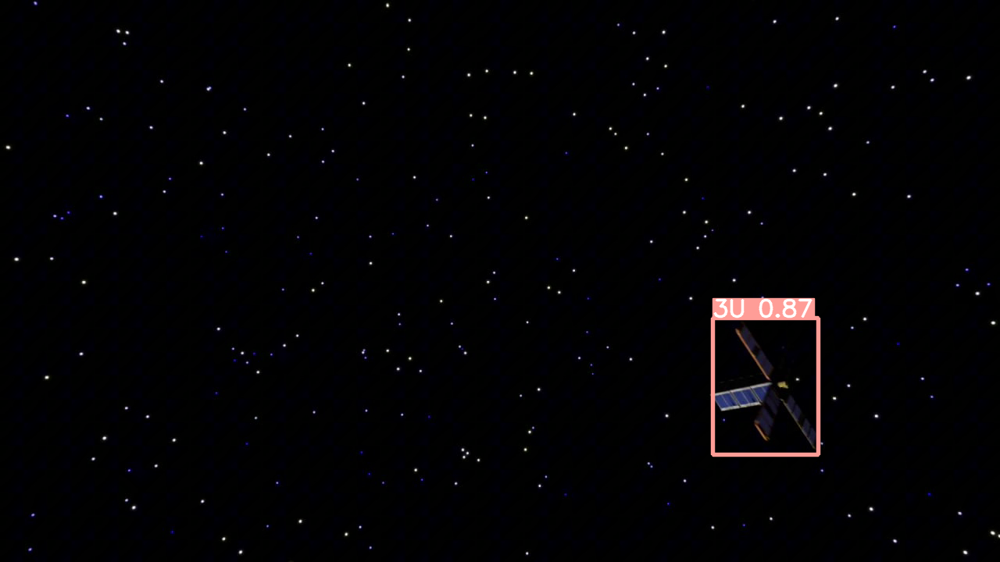


0: 640x640 1 3U, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.4ms pre

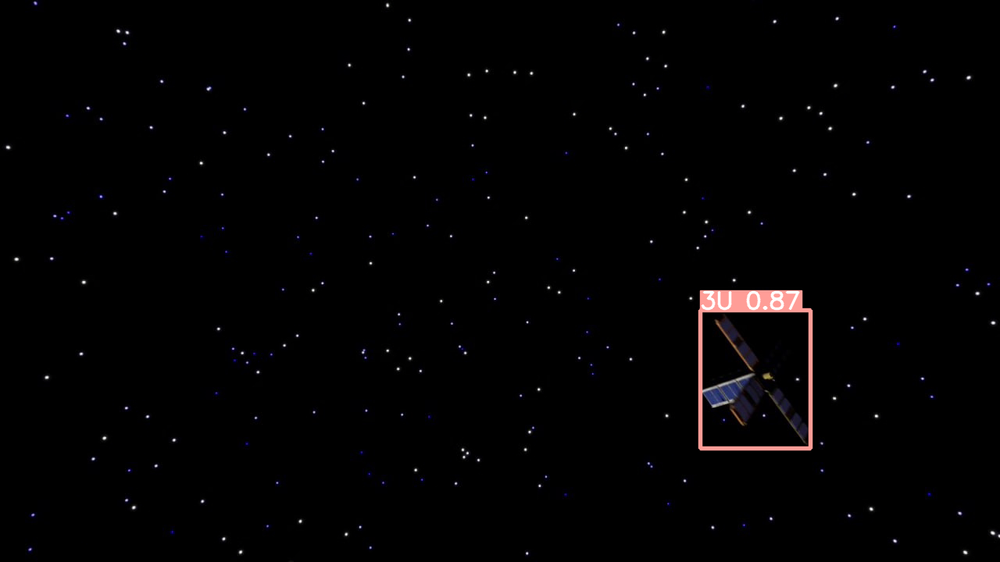


0: 640x640 1 3U, 7.8ms
Speed: 3.4ms preprocess, 7.8ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.1ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.1ms pre

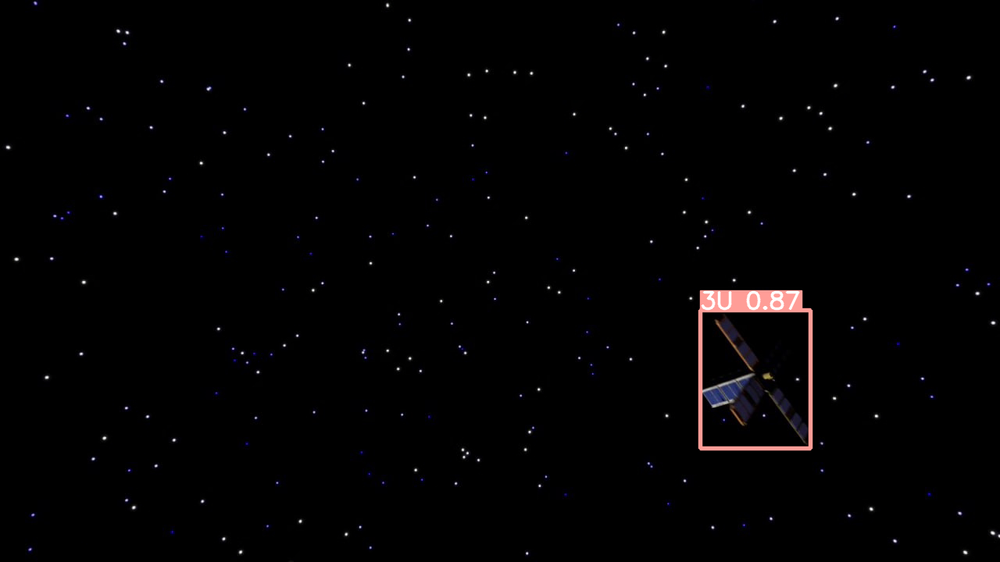


0: 640x640 1 3U, 7.8ms
Speed: 5.6ms preprocess, 7.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.9ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.4ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 3.8ms preprocess, 7.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.4ms
Speed: 2.2ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 5.2ms p

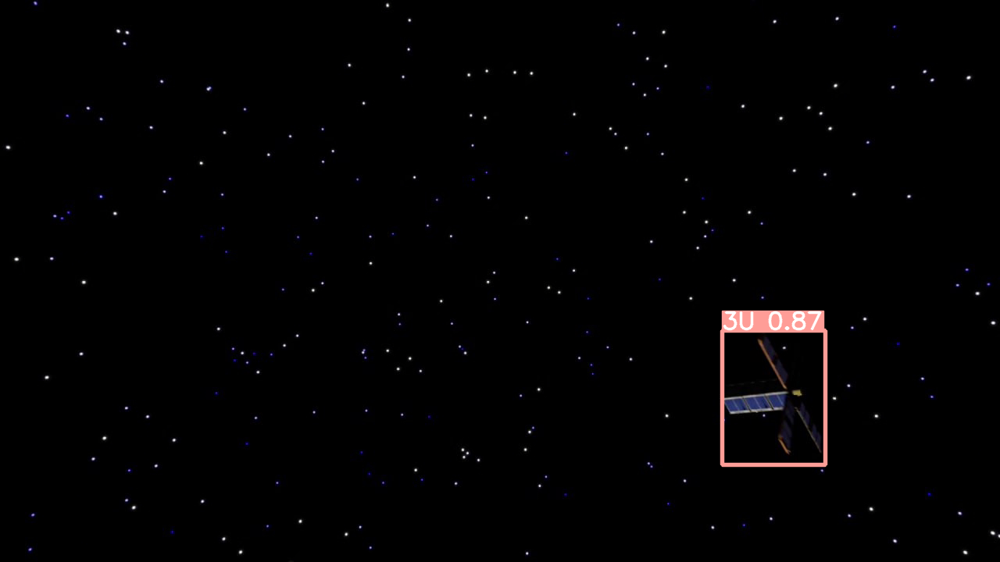


0: 640x640 1 3U, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.7ms preprocess, 7.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.3ms preprocess, 7.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms preprocess, 7.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.7ms
Speed: 2.2ms pre

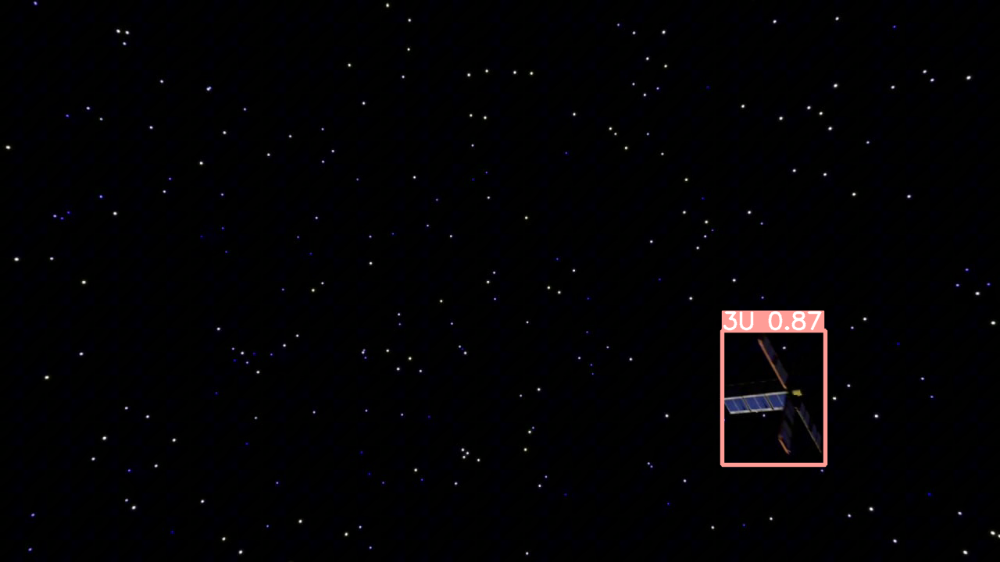


0: 640x640 1 3U, 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 3.5ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.2ms preprocess, 8.4ms inference, 5.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 3.3ms preprocess, 8.3ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms pre

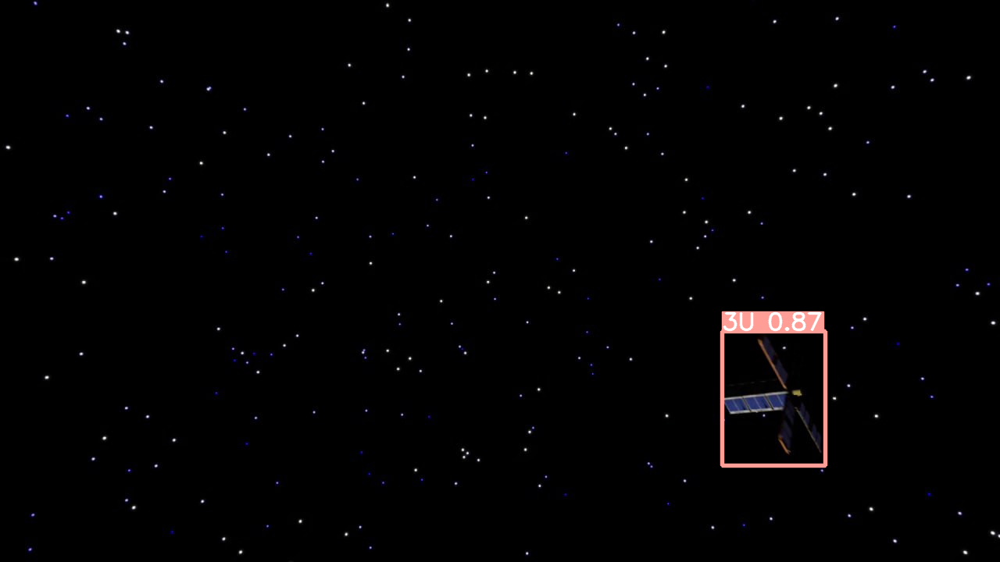


0: 640x640 1 3U, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.1ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.9ms
Speed: 2.3ms pr

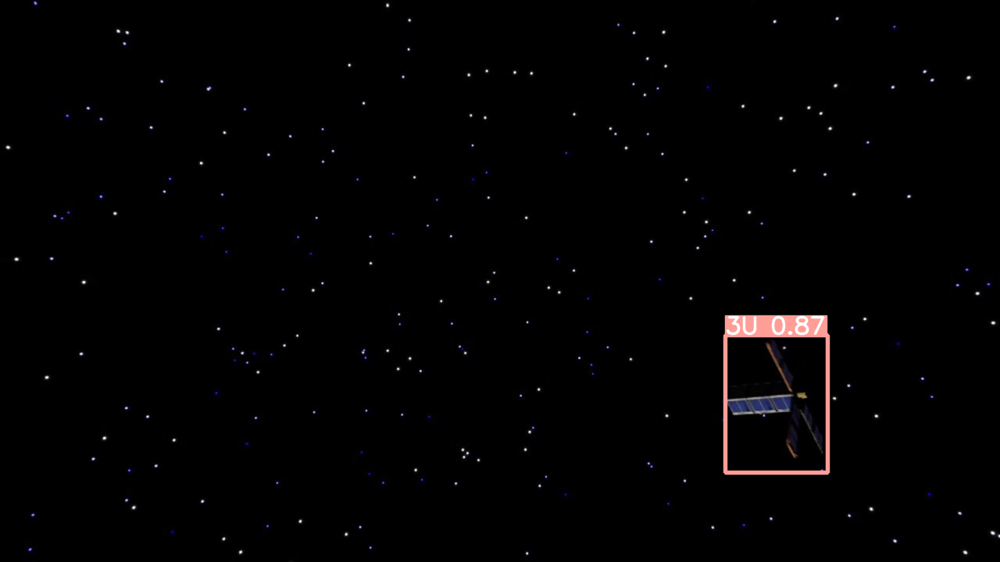


0: 640x640 1 3U, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 5.5ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.2ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.1ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.3ms pre

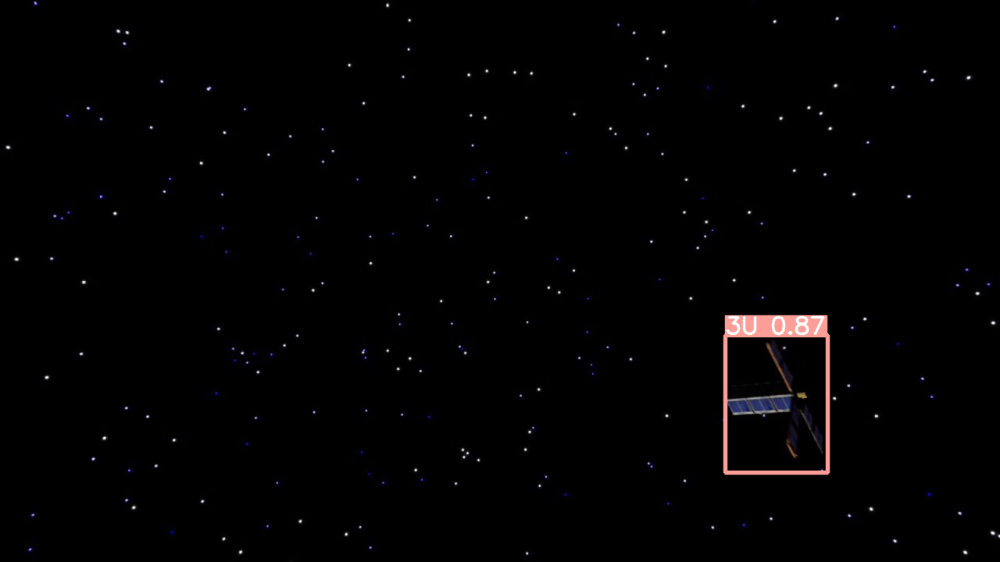


0: 640x640 1 3U, 9.4ms
Speed: 2.6ms preprocess, 9.4ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 3.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.0ms
Speed: 4.3ms preprocess, 10.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 4.5ms preprocess, 8.0ms inference, 3.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 4.2ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 4.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.0ms
Speed: 2.4ms preprocess, 10.0ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.4ms

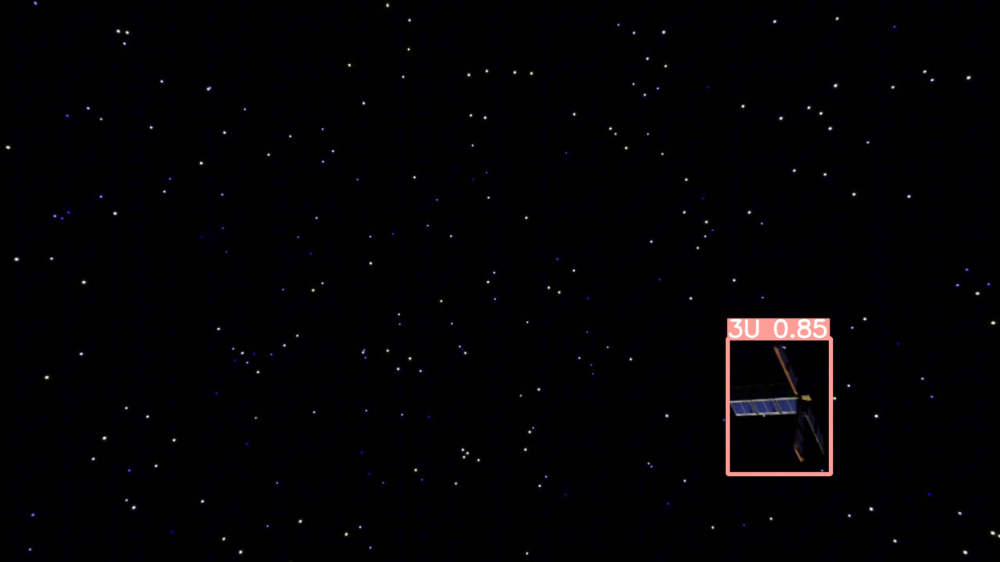


0: 640x640 1 3U, 8.8ms
Speed: 3.5ms preprocess, 8.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 3.1ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.6ms preprocess, 9.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.3ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.5ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 3.8ms preprocess, 9.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.8ms preprocess, 9.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.2ms preprocess, 9.2ms inference, 2.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 2.3ms pre

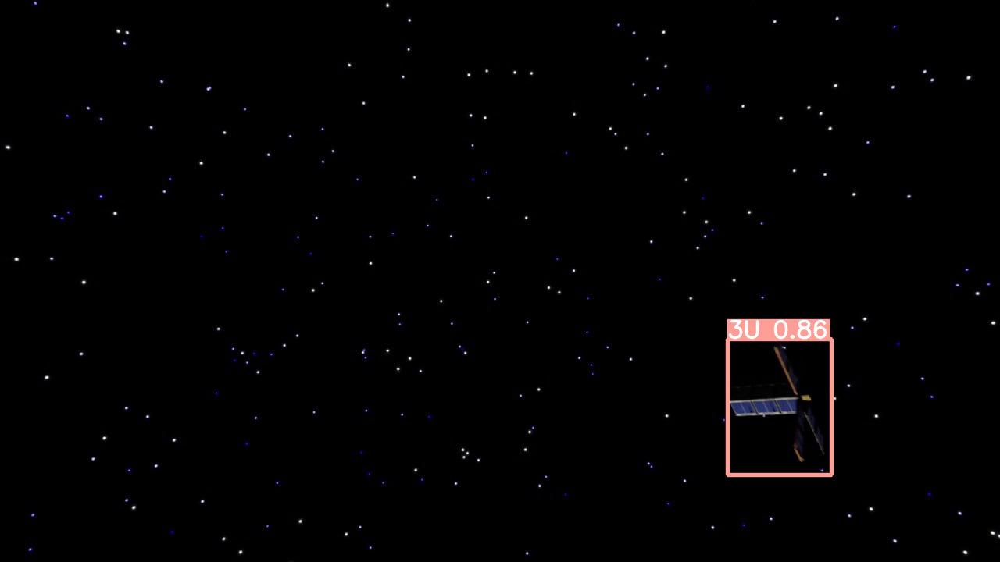


0: 640x640 1 3U, 9.1ms
Speed: 2.6ms preprocess, 9.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 2.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.1ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.4ms
Speed: 2.1ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.0ms preprocess, 9.0ms inference, 3.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.1ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 12.8ms
Speed: 7.2ms pr

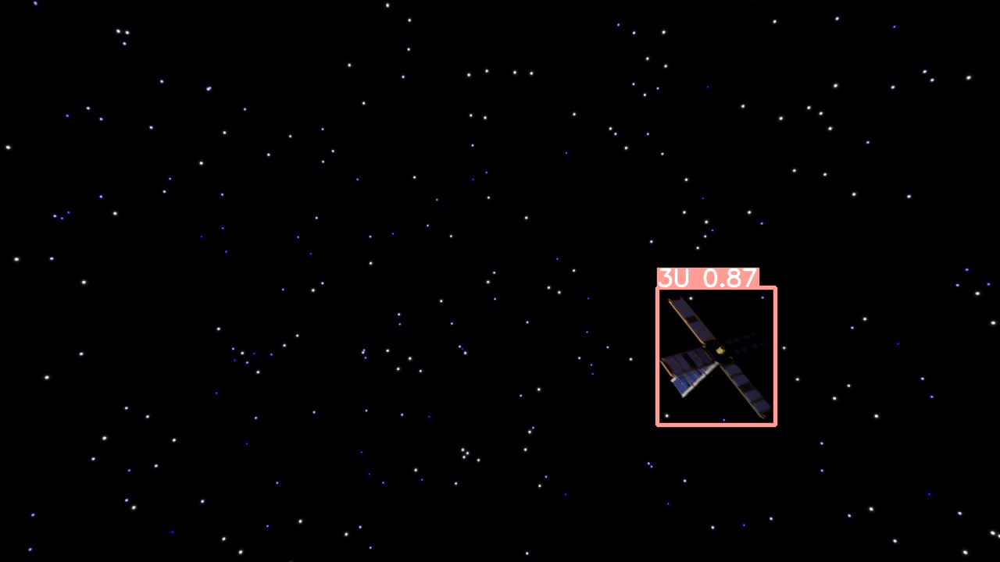


0: 640x640 1 3U, 9.0ms
Speed: 2.7ms preprocess, 9.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 5.4ms preprocess, 9.0ms inference, 4.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 3.4ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 3.3ms preprocess, 9.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 2.1ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms pre

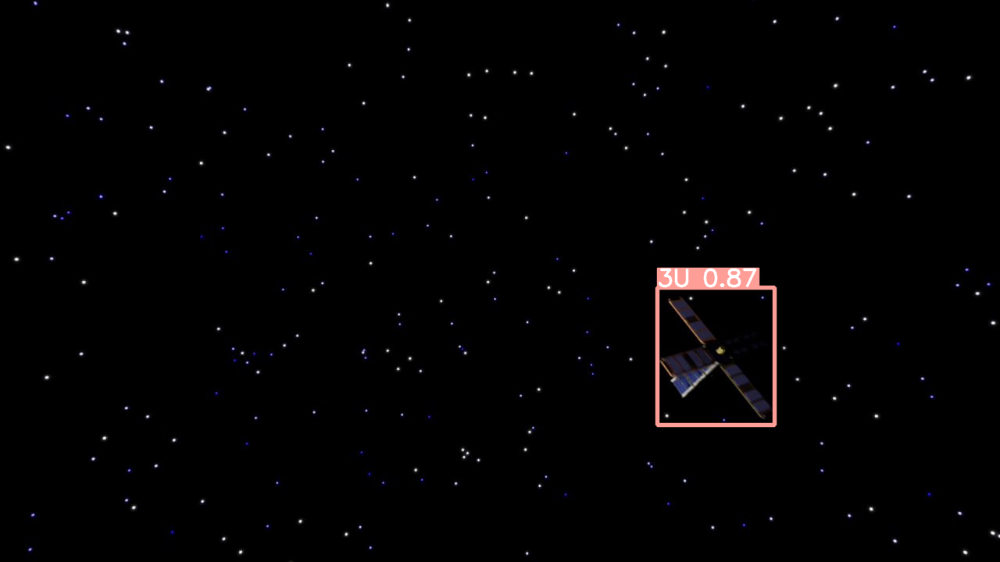


0: 640x640 1 3U, 10.2ms
Speed: 5.0ms preprocess, 10.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 13.5ms
Speed: 2.5ms preprocess, 13.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.1ms
Speed: 2.2ms preprocess, 11.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.8ms
Speed: 2.4ms preprocess, 11.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.0ms
Speed: 2.1ms preprocess, 10.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.5ms
Speed: 2.3ms preprocess, 11.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.1ms
Speed: 2.9ms preprocess, 10.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.1ms

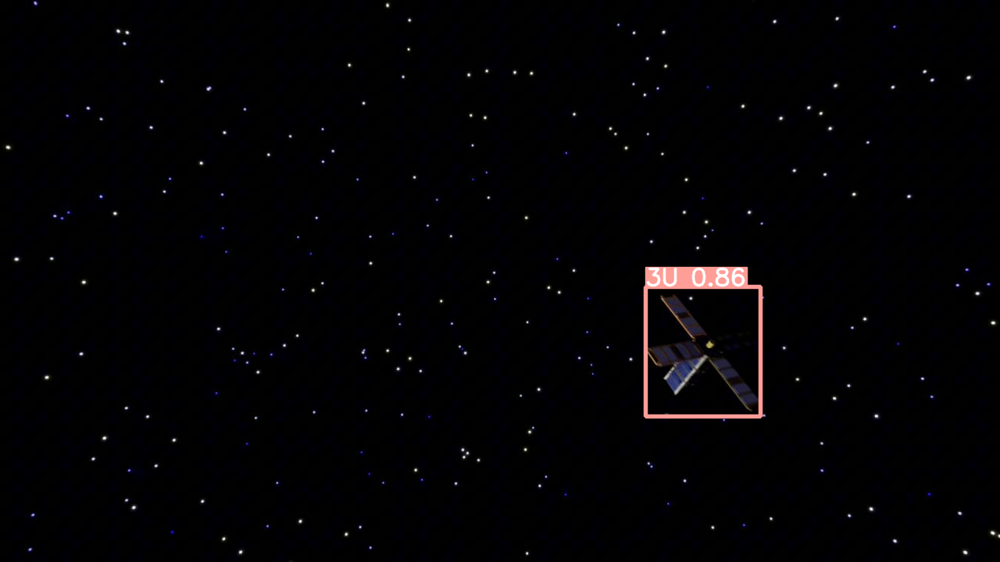


0: 640x640 1 3U, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.8ms
Speed: 2.1ms preprocess, 10.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.2ms preprocess, 10.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.2ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.1ms preprocess, 10.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms

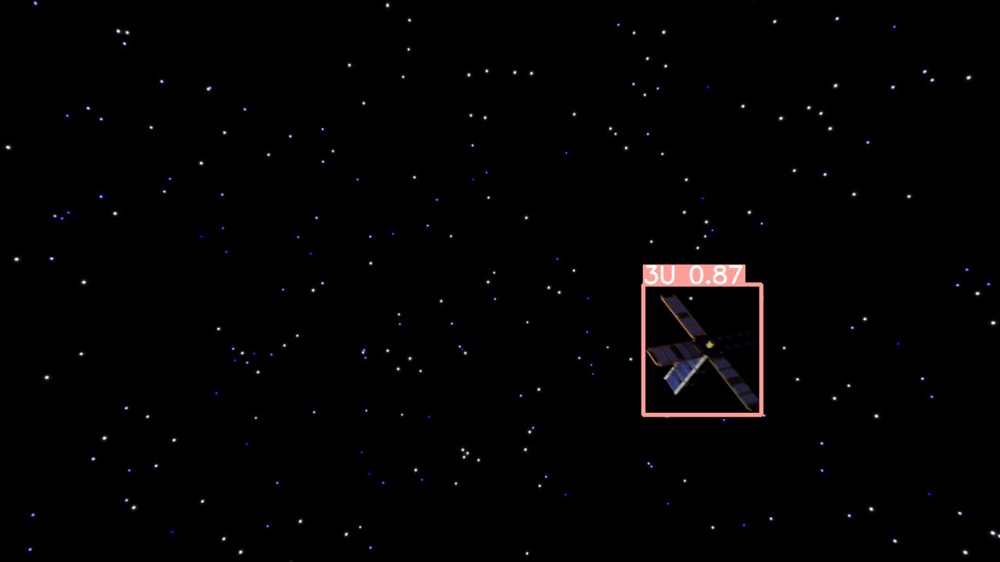


0: 640x640 1 3U, 9.7ms
Speed: 2.5ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 6.3ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 4.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.1ms
Speed: 2.1ms preprocess, 11.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.6ms
Speed: 2.1ms preprocess, 9.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.6ms
Speed: 2.2ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.6ms
Speed: 2.1ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.6ms
Speed: 2.2ms p

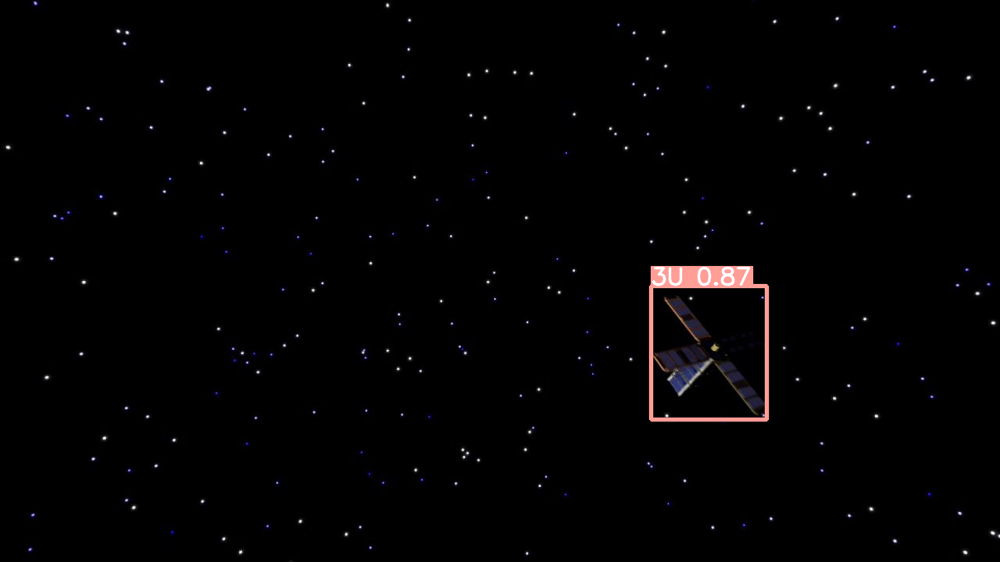


0: 640x640 1 3U, 9.0ms
Speed: 4.7ms preprocess, 9.0ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.9ms
Speed: 2.3ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.3ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.4ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.1ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.3ms pre

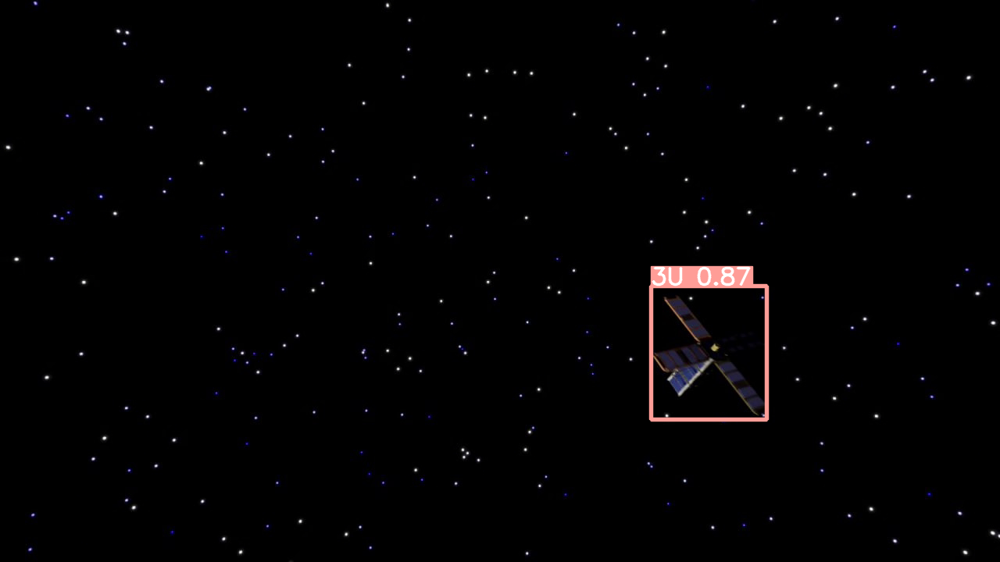


0: 640x640 1 3U, 8.9ms
Speed: 2.5ms preprocess, 8.9ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.2ms preprocess, 9.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.6ms
Speed: 2.3ms pr

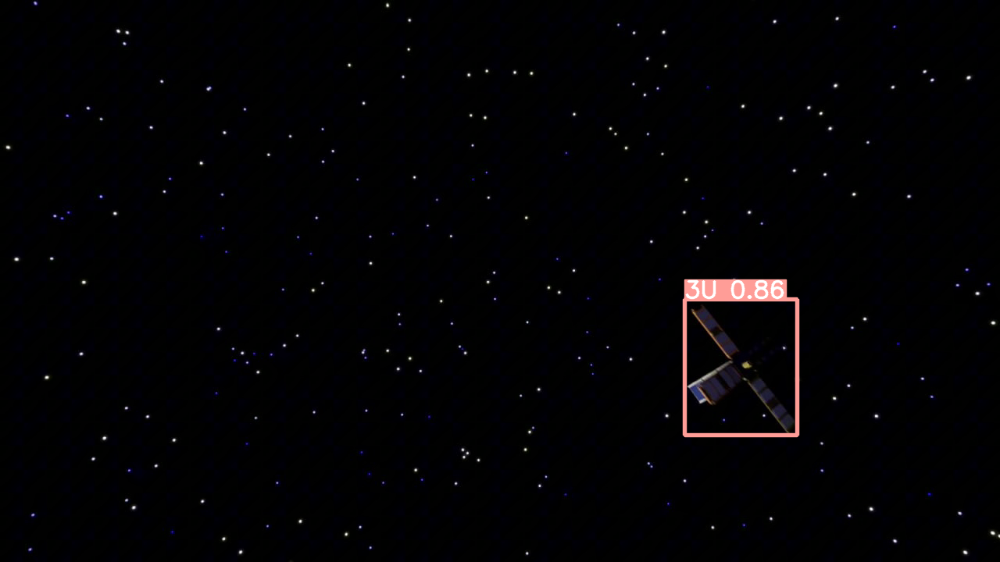


0: 640x640 1 3U, 8.1ms
Speed: 2.7ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms pre

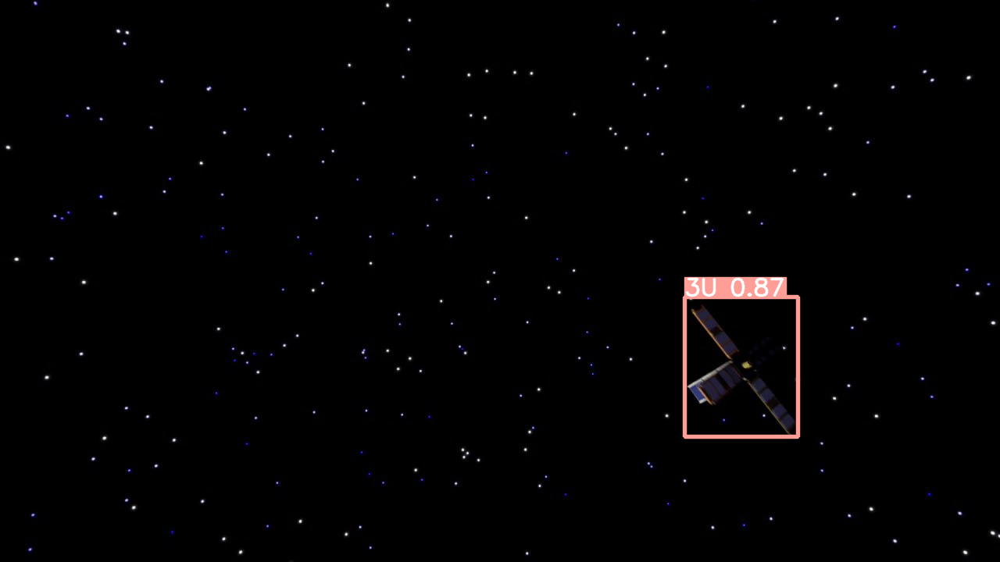


0: 640x640 1 3U, 8.1ms
Speed: 2.5ms preprocess, 8.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.8ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.1ms preprocess, 8.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms pre

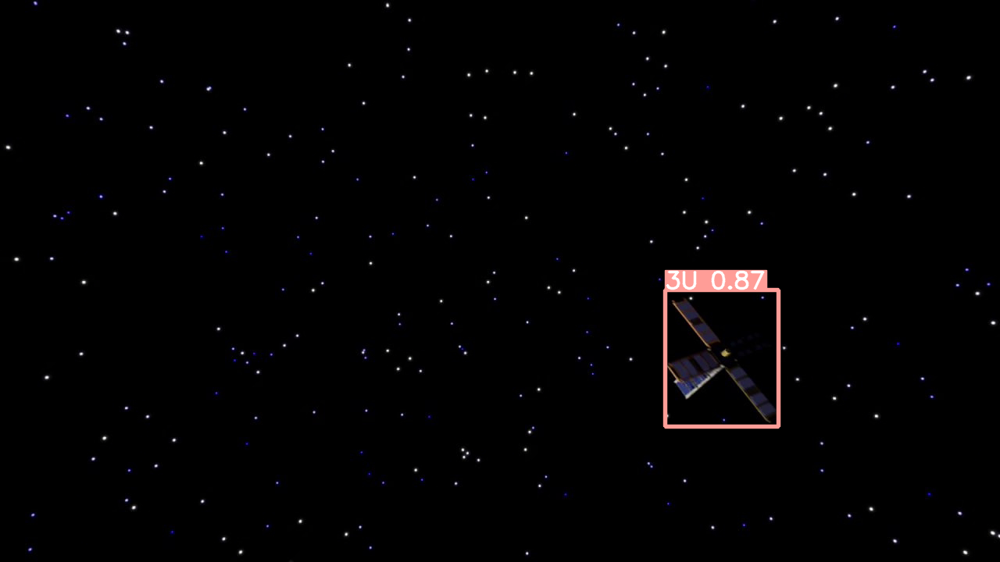


0: 640x640 1 3U, 8.8ms
Speed: 2.6ms preprocess, 8.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.9ms preprocess, 8.7ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.5ms pre

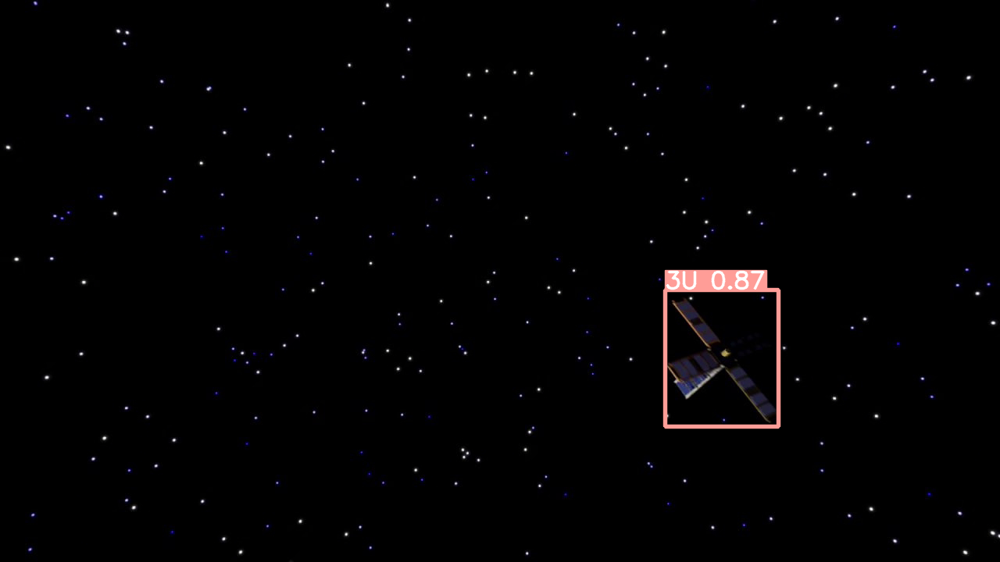


0: 640x640 1 3U, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.4ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 4.1ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 12.7ms
Speed: 2.3ms preprocess, 12.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 3.2ms preprocess, 9.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.4ms p

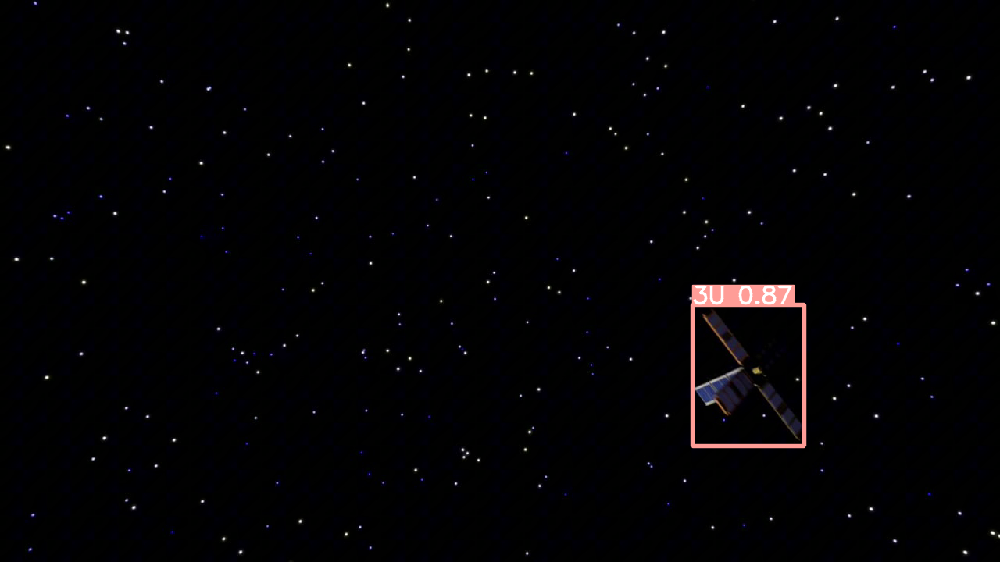


0: 640x640 1 3U, 9.4ms
Speed: 3.0ms preprocess, 9.4ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.6ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 3.0ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 2.7ms preprocess, 9.9ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.6ms preprocess, 9.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.4ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.5ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.5ms pre

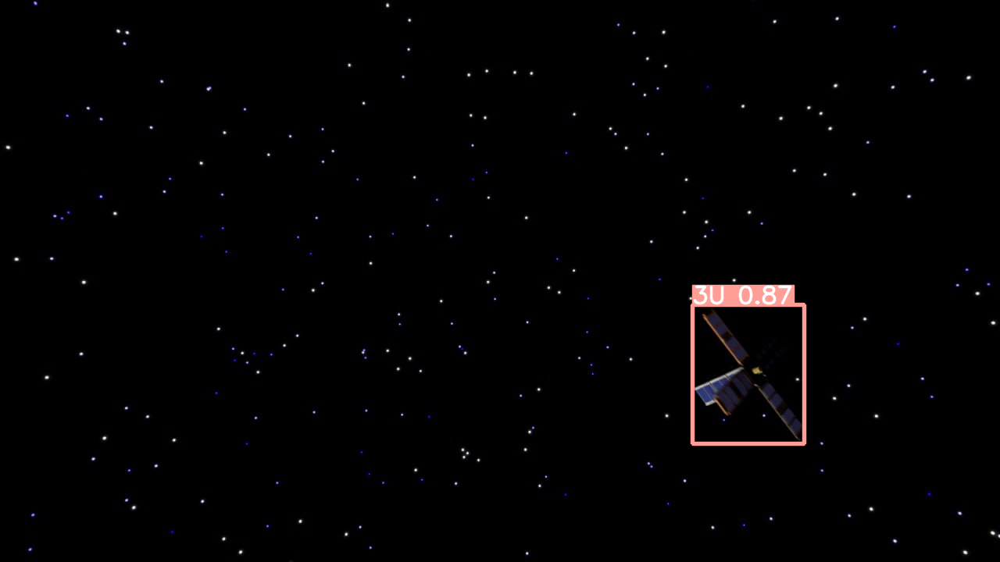


0: 640x640 1 3U, 8.7ms
Speed: 4.9ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 3.0ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.9ms pre

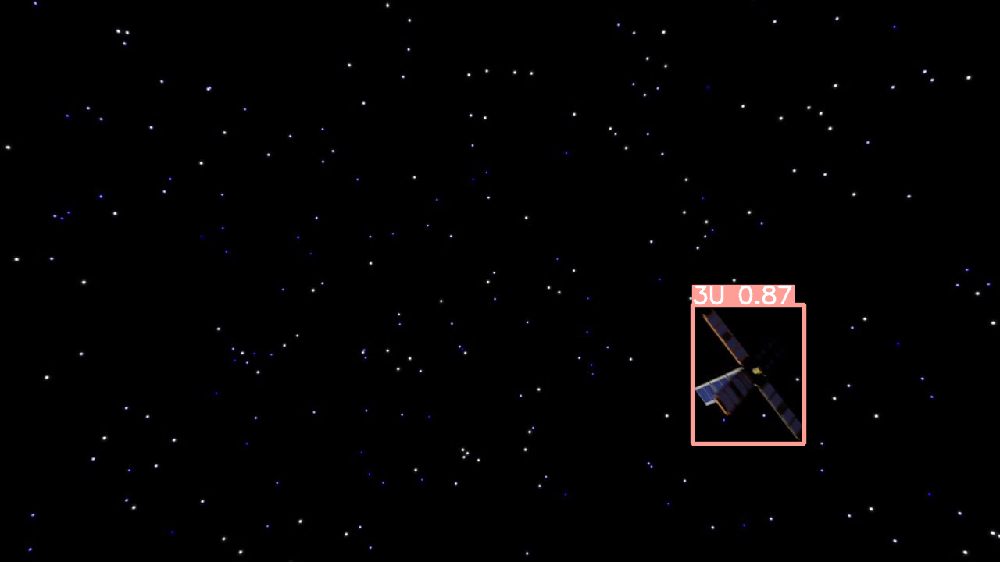


0: 640x640 1 3U, 8.7ms
Speed: 2.6ms preprocess, 8.7ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.1ms preprocess, 8.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms pre

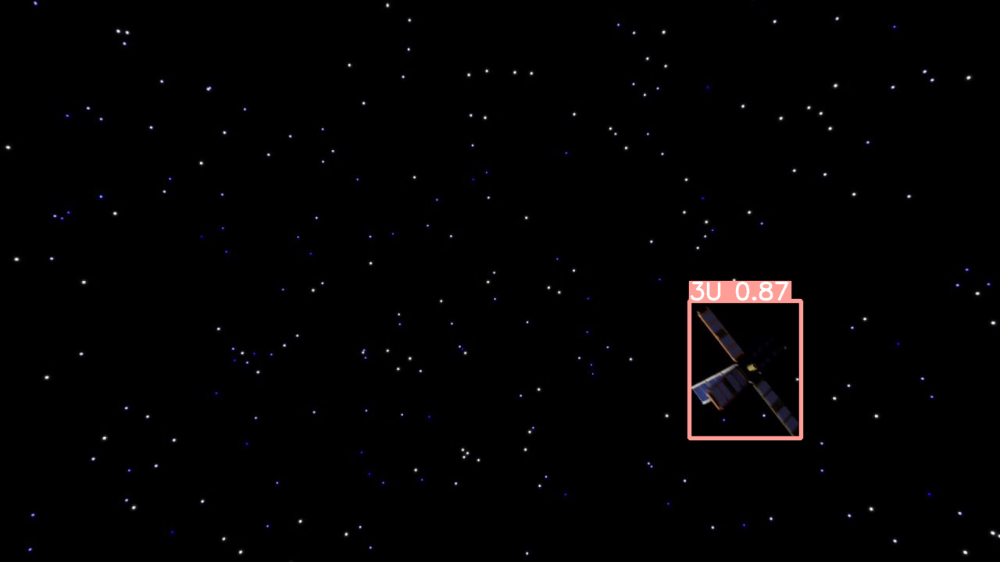


0: 640x640 1 3U, 8.2ms
Speed: 2.9ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 4.2ms preprocess, 9.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.1ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.4ms
Speed: 2.1ms preprocess, 8.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 3.8ms pre

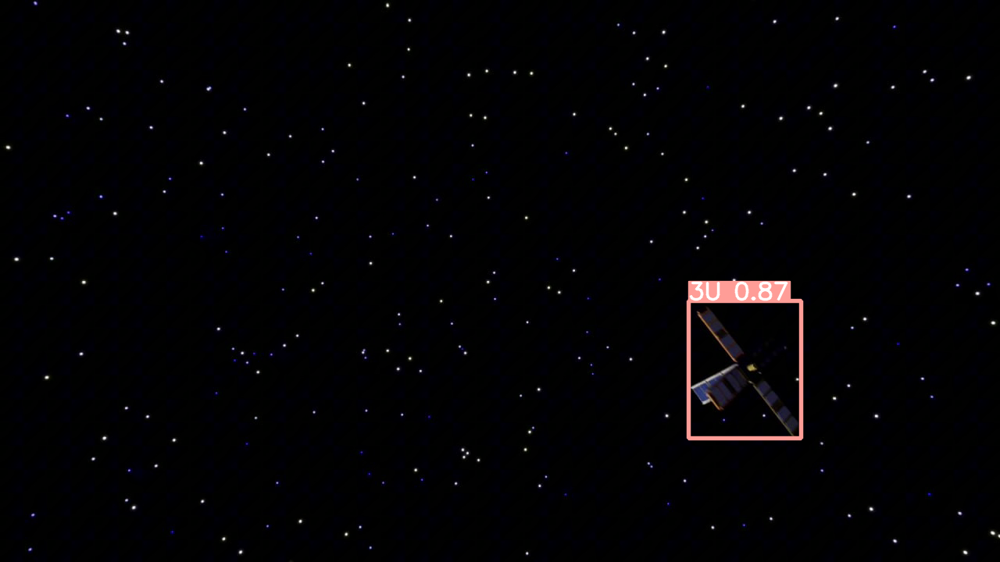


0: 640x640 1 3U, 10.3ms
Speed: 2.8ms preprocess, 10.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.3ms
Speed: 5.0ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.4ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.3ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.2ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms

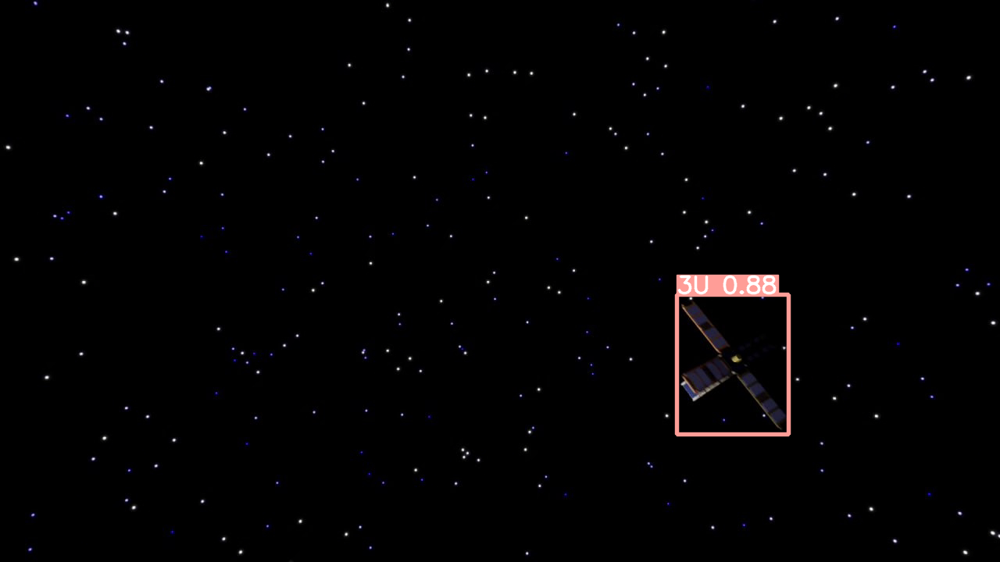


0: 640x640 1 3U, 8.2ms
Speed: 2.8ms preprocess, 8.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.3ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.4ms preprocess, 8.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.3ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 18.1ms
Speed: 11.1ms preprocess, 18.1ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 14.8ms
Speed: 2.3ms preprocess, 14.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 12.2ms
Speed: 4.5ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 3.0ms preprocess, 8.1ms inference, 5.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.

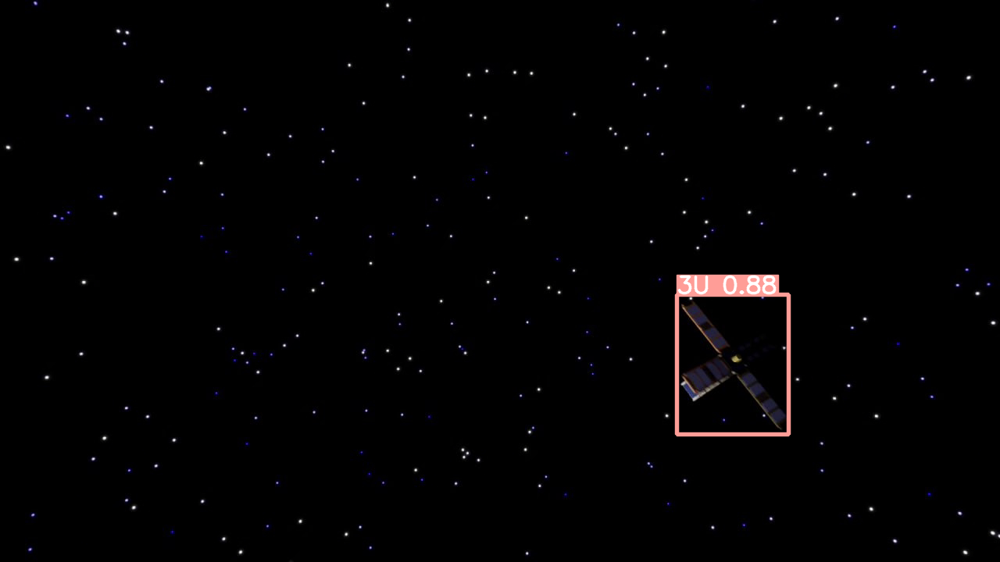


0: 640x640 1 3U, 8.1ms
Speed: 2.8ms preprocess, 8.1ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 5.6ms preprocess, 8.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.2ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.4ms preprocess, 8.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 4.2ms preprocess, 8.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.1ms
Speed: 2.2ms preprocess, 8.1ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.2ms
Speed: 2.1ms preprocess, 8.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 4.2ms pre

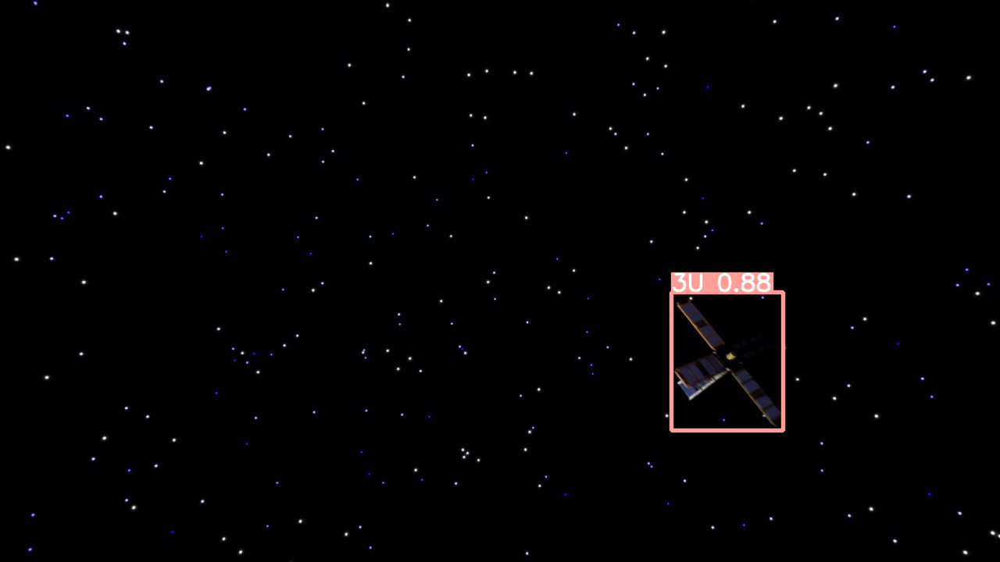


0: 640x640 1 3U, 7.9ms
Speed: 5.9ms preprocess, 7.9ms inference, 4.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.2ms preprocess, 9.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.7ms
Speed: 2.3ms preprocess, 10.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.3ms preprocess, 7.8ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.1ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.0ms p

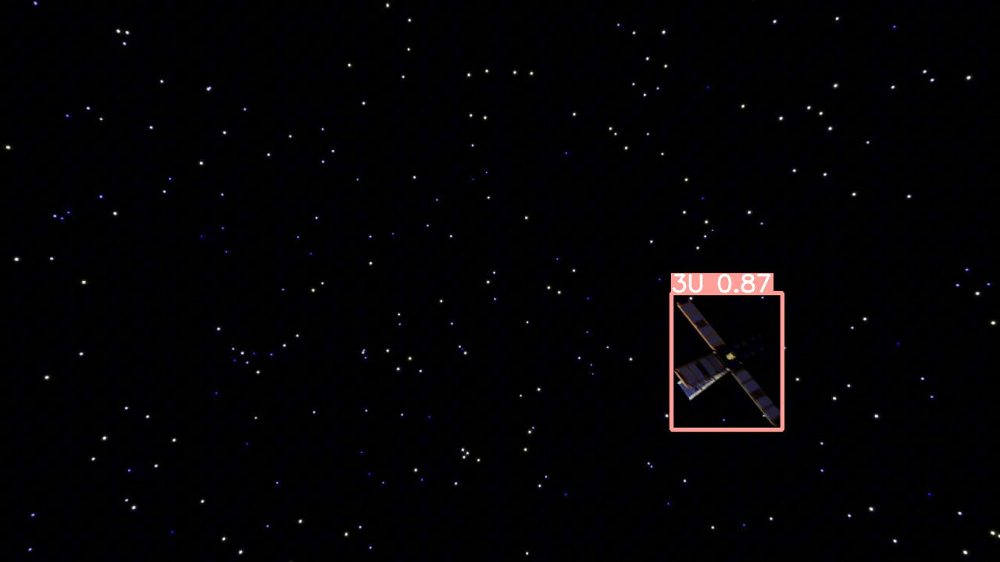


0: 640x640 1 3U, 7.9ms
Speed: 3.2ms preprocess, 7.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.2ms preprocess, 7.8ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.4ms preprocess, 7.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.5ms preprocess, 7.8ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.6ms preprocess, 7.8ms inference, 6.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.2ms
Speed: 4.6ms preprocess, 9.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.8ms
Speed: 2.9ms pre

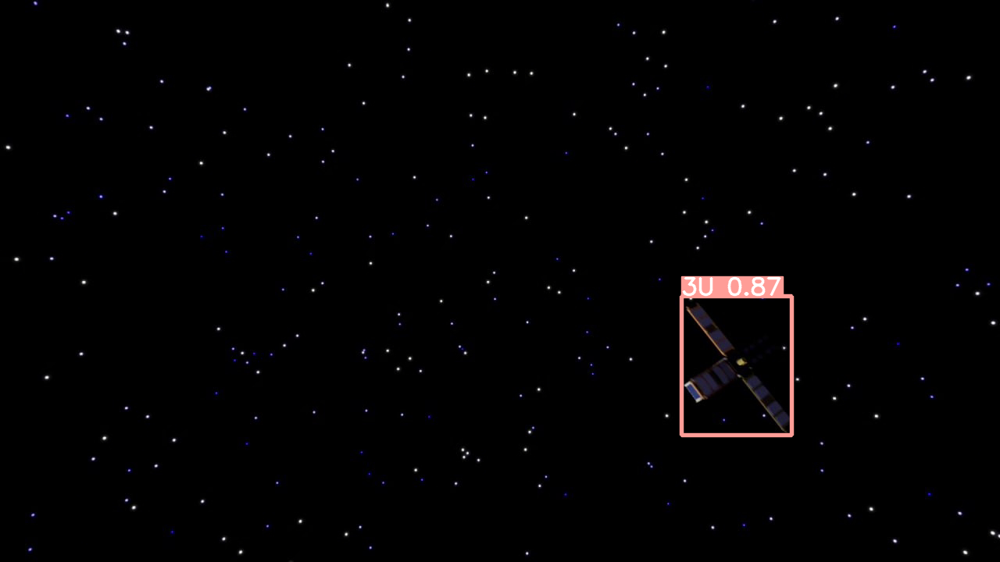


0: 640x640 1 3U, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.2ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.6ms preprocess, 9.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.2ms
Speed: 2.4ms preprocess, 10.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.4ms
Speed: 2.5ms preprocess, 9.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.4ms p

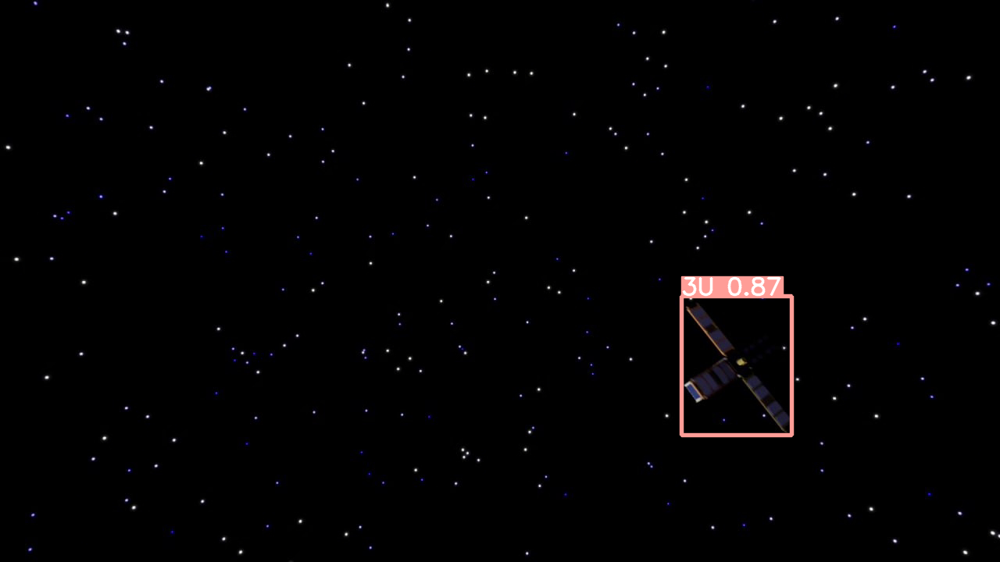


0: 640x640 1 3U, 9.7ms
Speed: 2.7ms preprocess, 9.7ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.5ms
Speed: 2.7ms preprocess, 10.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 3.3ms preprocess, 9.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 2.5ms preprocess, 9.7ms inference, 3.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 2.4ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.6ms
Speed: 2.4ms preprocess, 10.6ms inference, 4.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.2ms

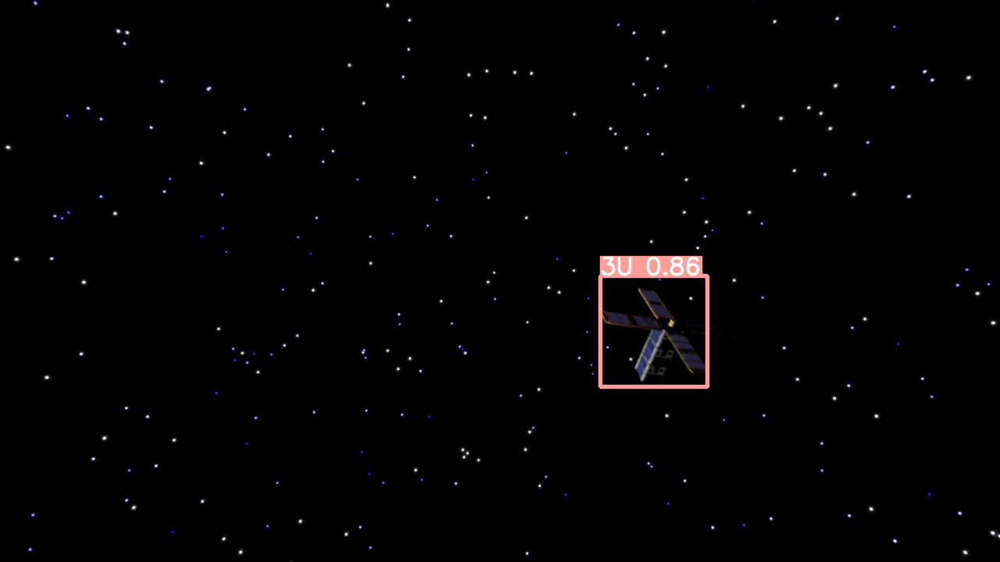


0: 640x640 1 3U, 12.0ms
Speed: 3.0ms preprocess, 12.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.5ms
Speed: 4.5ms preprocess, 10.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 2.5ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.7ms
Speed: 2.4ms preprocess, 11.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.4ms
Speed: 3.5ms preprocess, 10.4ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.3ms
Speed: 2.5ms preprocess, 10.3ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.3ms
Speed: 2.3ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.3ms
Speed: 2.2ms preprocess, 10.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.6ms
S

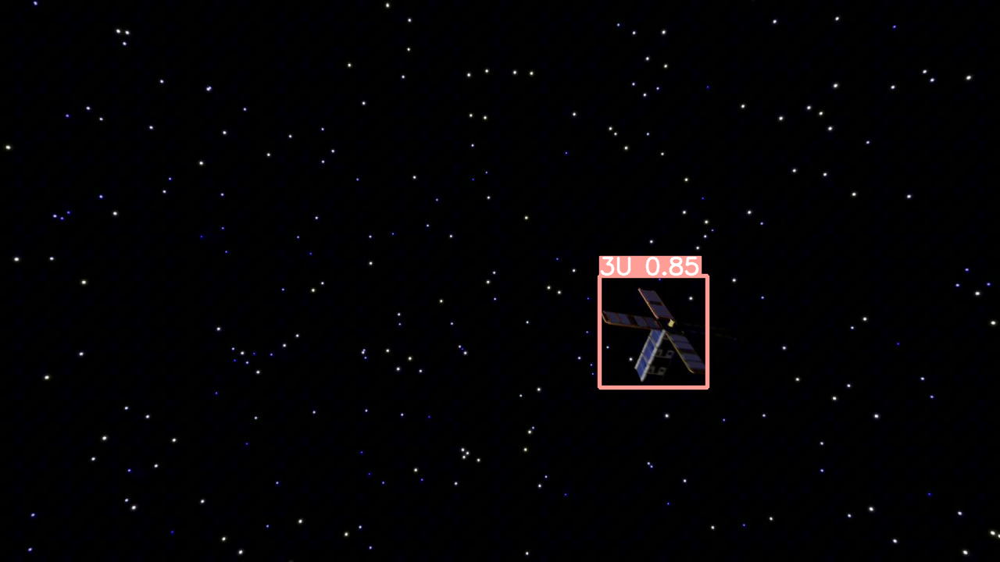


0: 640x640 1 3U, 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.9ms preprocess, 9.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.8ms
Speed: 2.5ms preprocess, 11.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.3ms
Speed: 2.2ms preprocess, 11.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.9ms

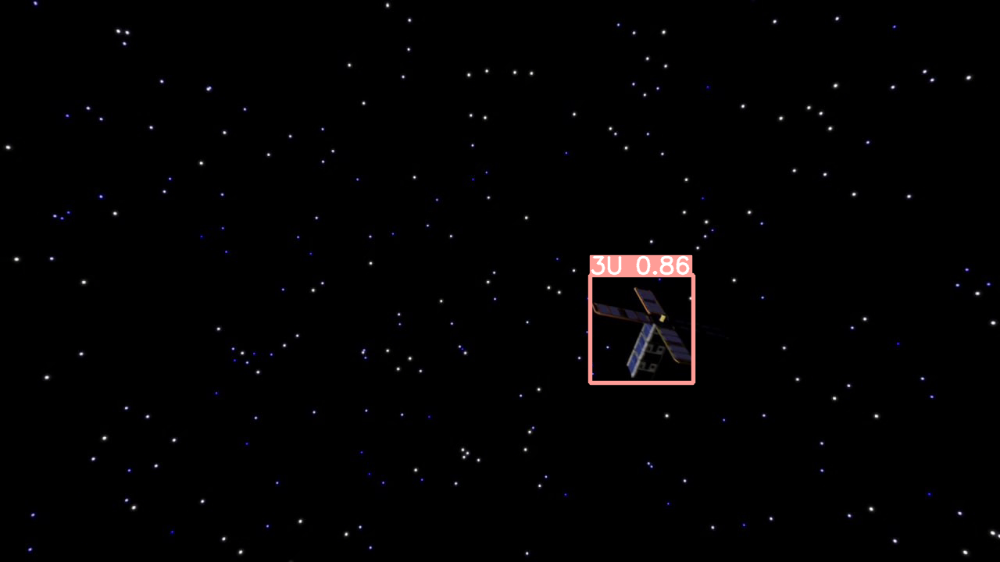


0: 640x640 1 3U, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 3.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 3.1ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms pre

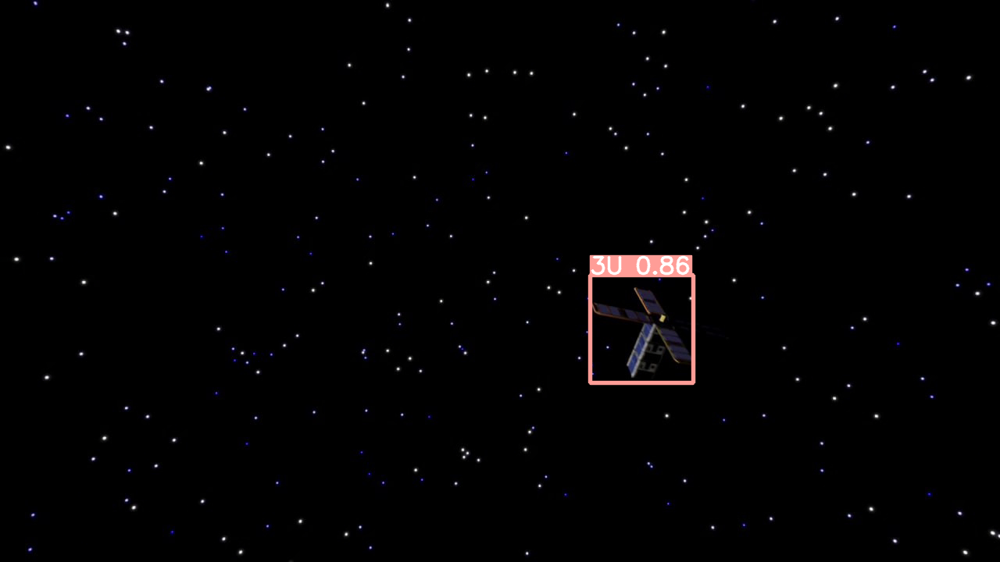


0: 640x640 1 3U, 8.7ms
Speed: 7.1ms preprocess, 8.7ms inference, 5.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.5ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 3.8ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.4ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms pre

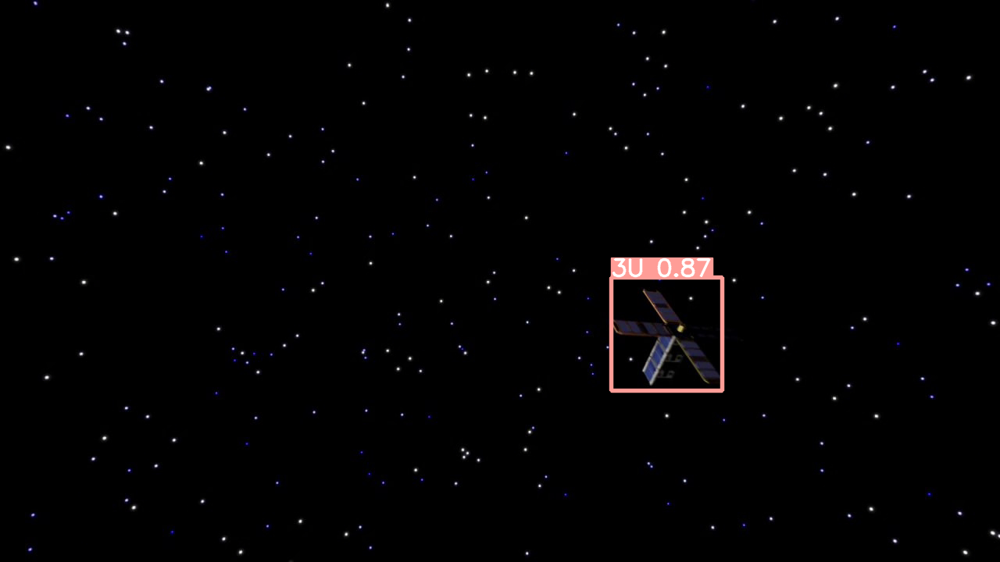


0: 640x640 1 3U, 8.6ms
Speed: 2.7ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.3ms preprocess, 8.6ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.4ms pre

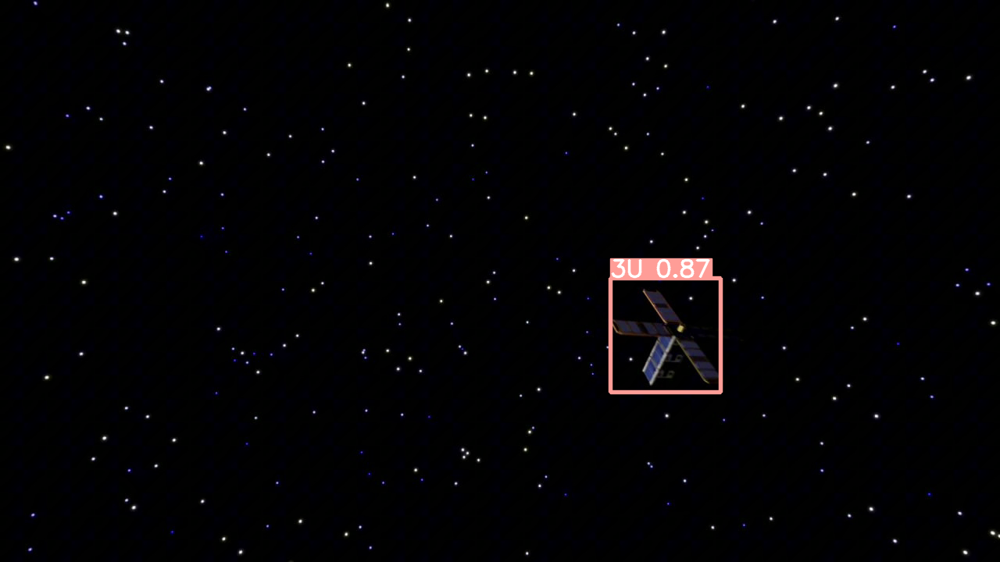


0: 640x640 1 3U, 8.3ms
Speed: 2.9ms preprocess, 8.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.6ms preprocess, 8.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.8ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.4ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 3.8ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.5ms pre

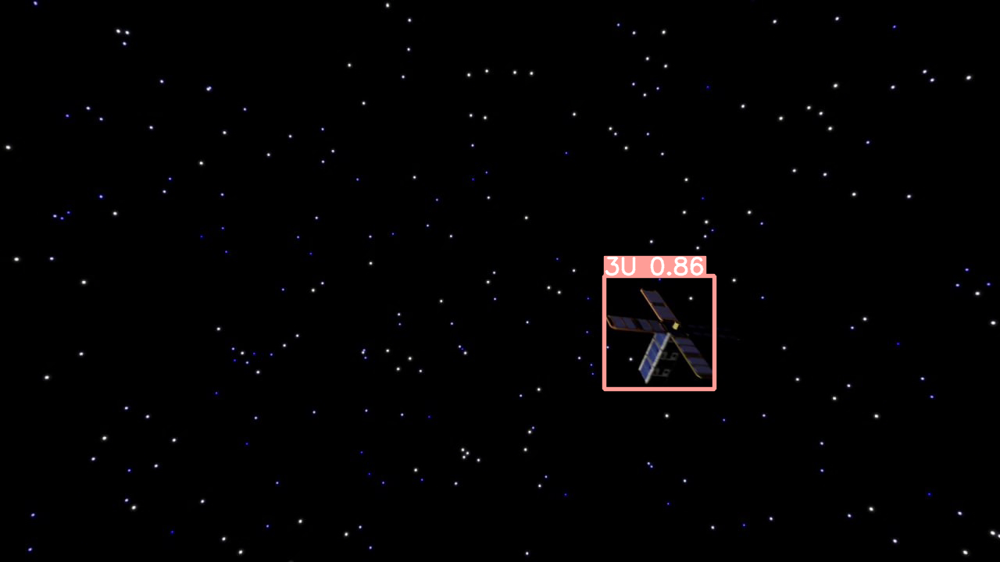


0: 640x640 1 3U, 8.0ms
Speed: 5.4ms preprocess, 8.0ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 5.7ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.8ms
Speed: 2.5ms preprocess, 9.8ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.0ms
Speed: 2.5ms preprocess, 8.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.7ms preprocess, 7.9ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.6ms preprocess, 7.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 7.9ms
Speed: 2.6ms pre

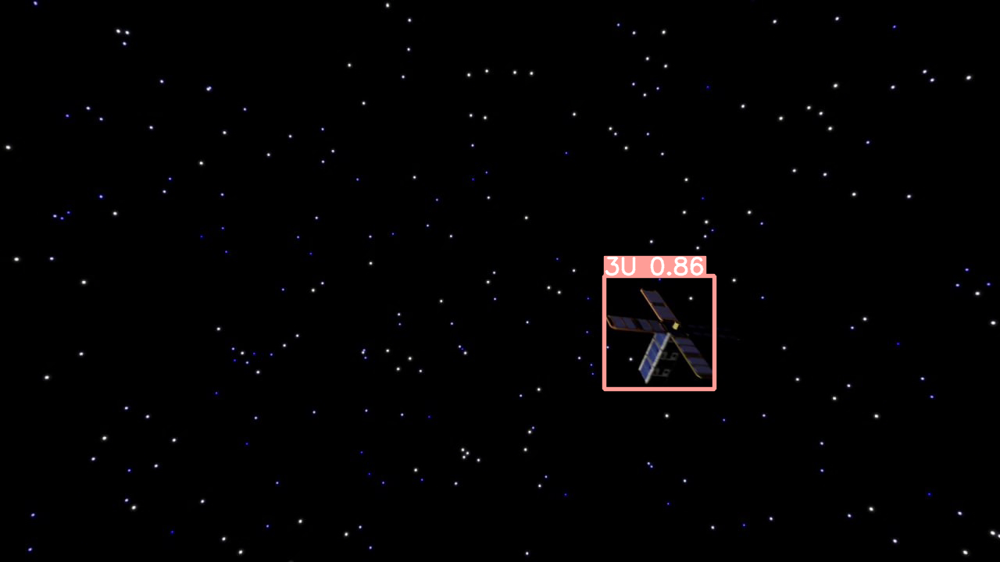


0: 640x640 1 3U, 9.5ms
Speed: 5.8ms preprocess, 9.5ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.9ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.5ms pre

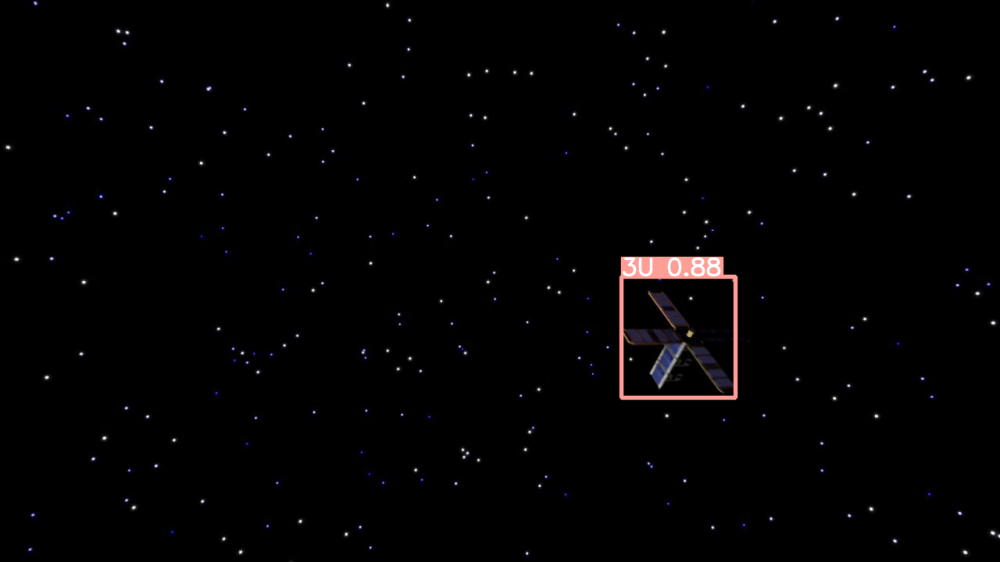


0: 640x640 1 3U, 8.7ms
Speed: 4.2ms preprocess, 8.7ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms pre

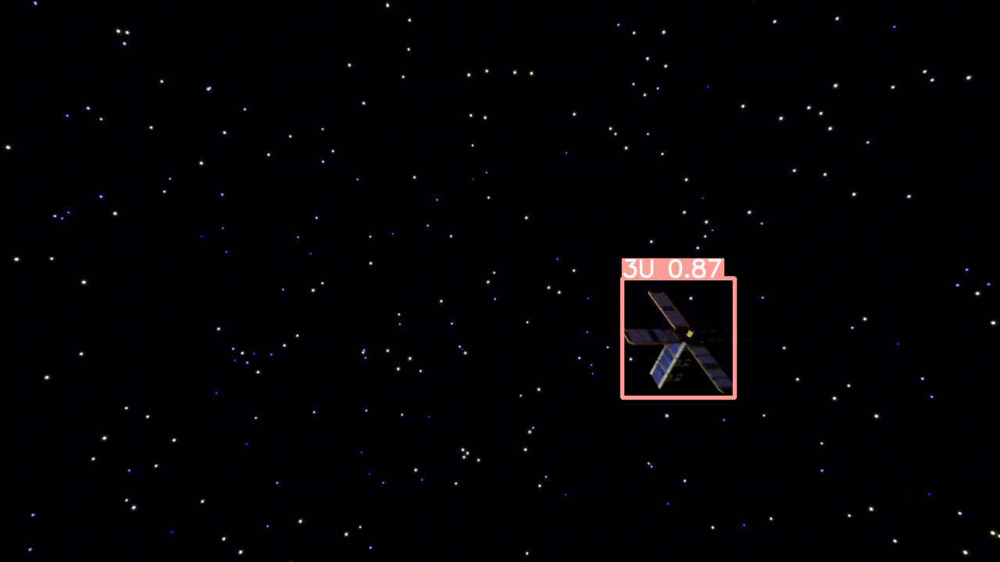


0: 640x640 1 3U, 8.9ms
Speed: 2.8ms preprocess, 8.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms pre

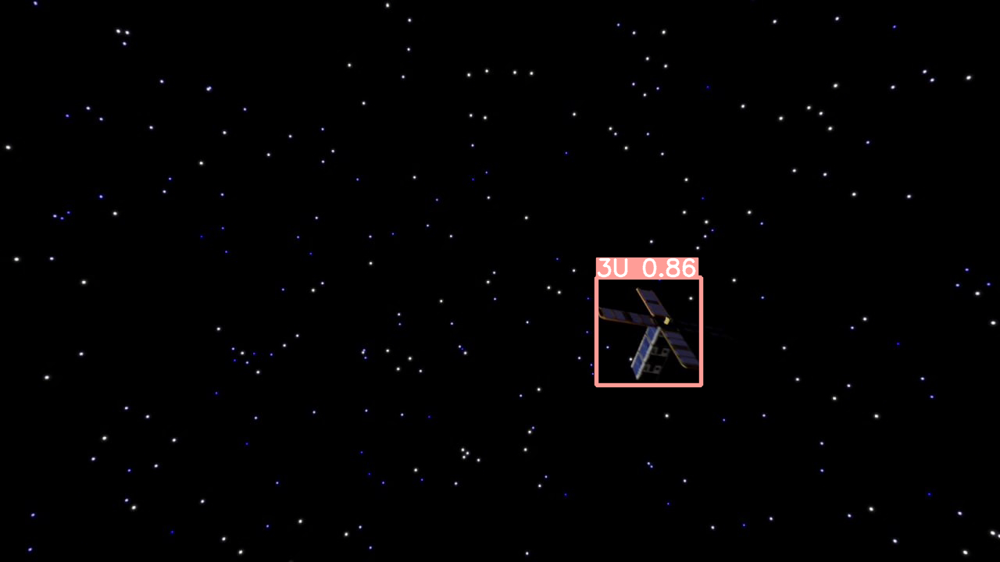


0: 640x640 1 3U, 9.5ms
Speed: 2.7ms preprocess, 9.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.5ms preprocess, 9.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.1ms
Speed: 2.3ms preprocess, 11.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.1ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.9ms
Speed: 2.3ms preprocess, 9.9ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.7ms
Speed: 2.3ms preprocess, 9.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.6ms
Speed: 2.3ms p

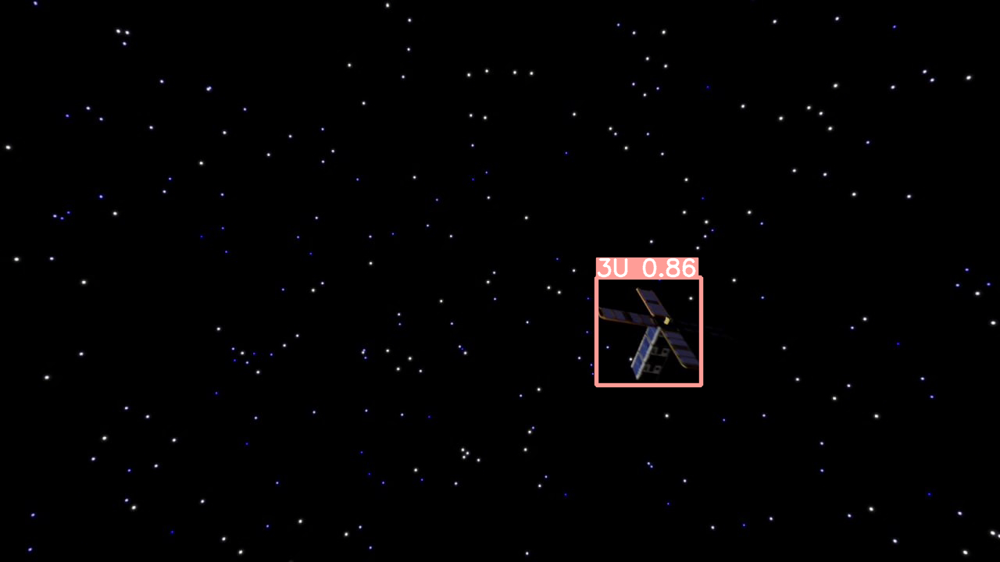


0: 640x640 1 3U, 8.8ms
Speed: 4.9ms preprocess, 8.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 15.9ms
Speed: 2.5ms preprocess, 15.9ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 13.0ms
Speed: 4.6ms preprocess, 13.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.1ms
Speed: 2.3ms preprocess, 9.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.4ms preprocess, 8.7ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms preprocess, 8.8ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.3ms

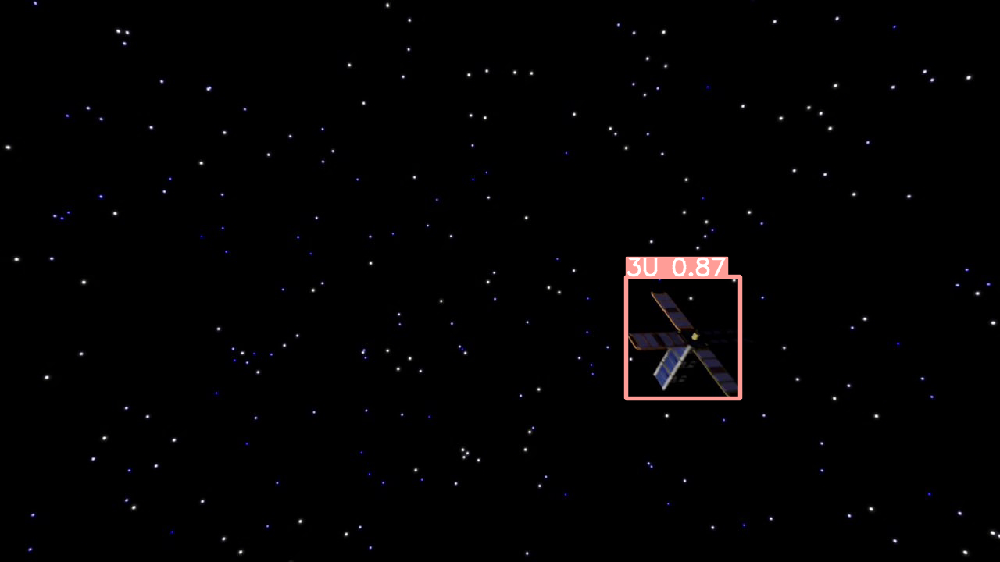


0: 640x640 1 3U, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.2ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.7ms
Speed: 2.1ms preprocess, 8.7ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.8ms
Speed: 2.2ms pre

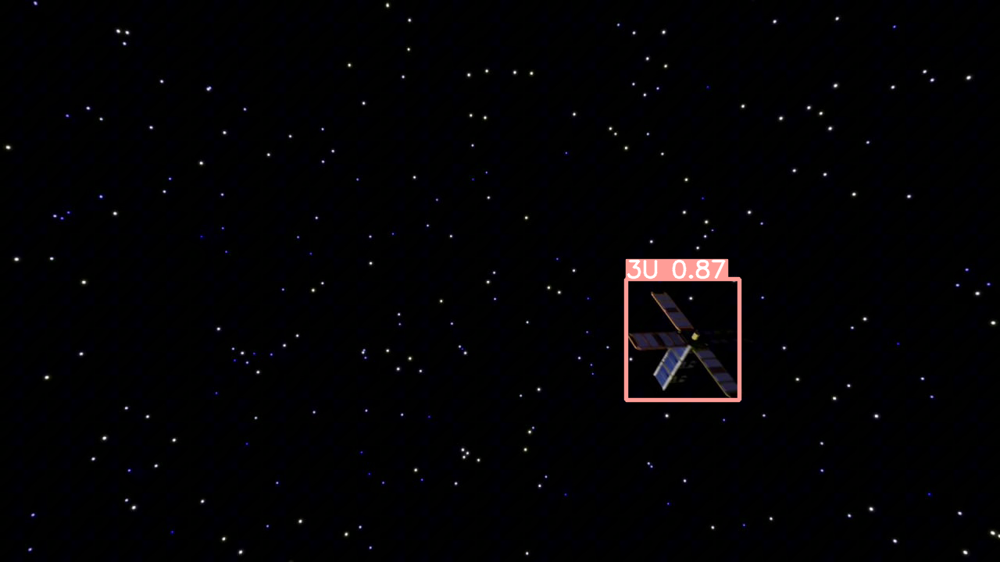


0: 640x640 1 3U, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 3.0ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms pre

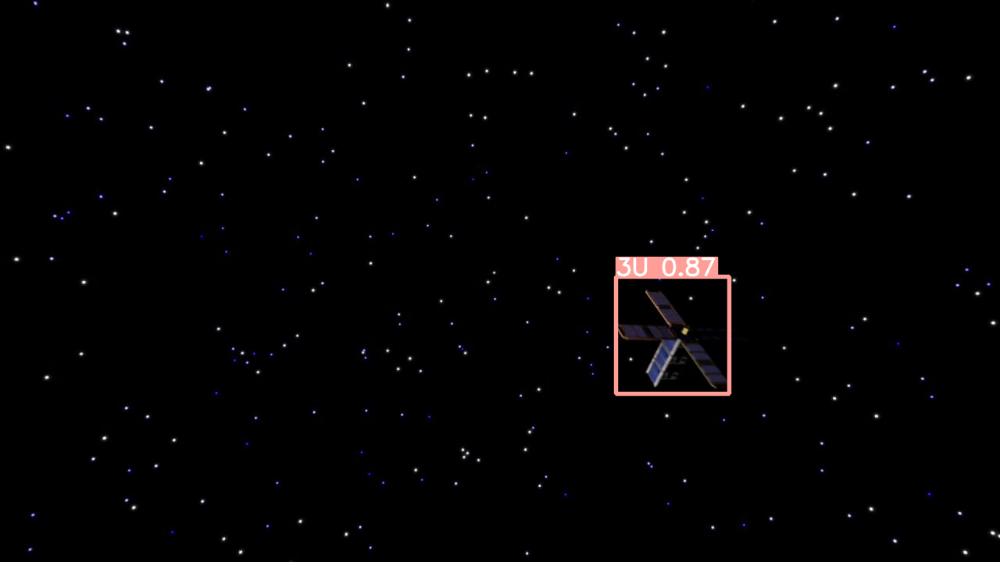


0: 640x640 1 3U, 8.3ms
Speed: 2.6ms preprocess, 8.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.7ms preprocess, 8.3ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.4ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.6ms
Speed: 2.2ms preprocess, 11.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 4.1ms preprocess, 8.3ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 3.9ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.2ms preprocess, 8.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.3ms preprocess, 8.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.3ms
Speed: 2.1ms p

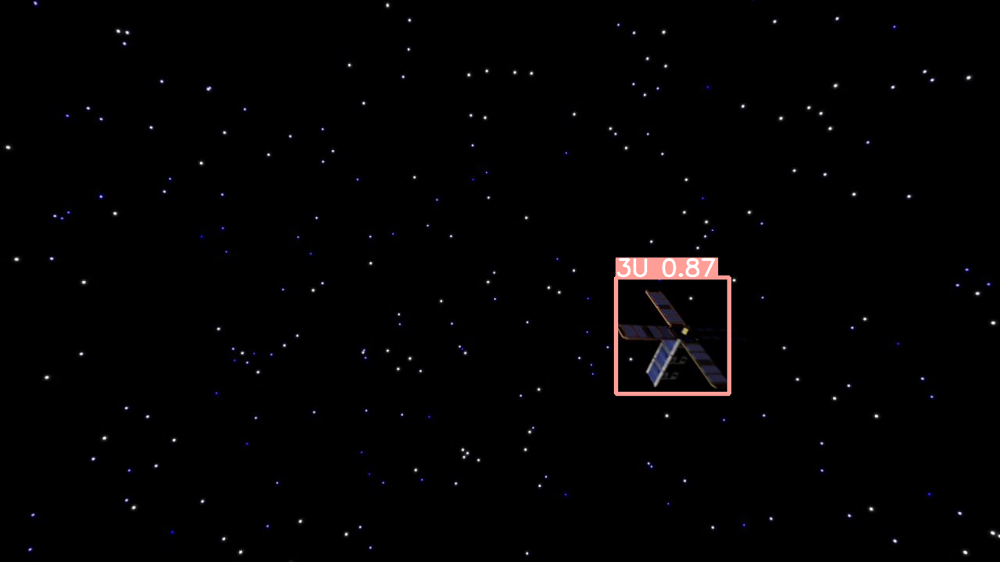


0: 640x640 1 3U, 8.6ms
Speed: 3.0ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 3.0ms preprocess, 8.6ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.9ms
Speed: 4.1ms preprocess, 8.9ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.2ms preprocess, 8.6ms inference, 2.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.5ms
Speed: 2.2ms preprocess, 10.5ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 3.6ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.2ms
Speed: 2.2ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.3ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.3ms

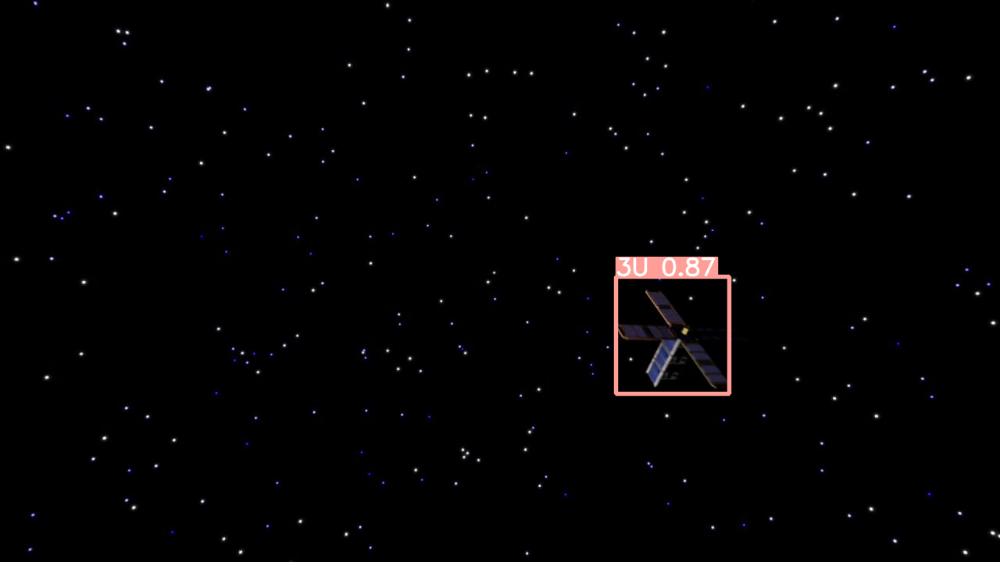


0: 640x640 1 3U, 10.2ms
Speed: 2.6ms preprocess, 10.2ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.4ms
Speed: 3.7ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.6ms
Speed: 2.6ms preprocess, 8.6ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.6ms
Speed: 4.2ms preprocess, 11.6ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.6ms
Speed: 2.1ms preprocess, 9.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.1ms preprocess, 8.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.2ms preprocess, 8.5ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 8.5ms
Speed: 2.1

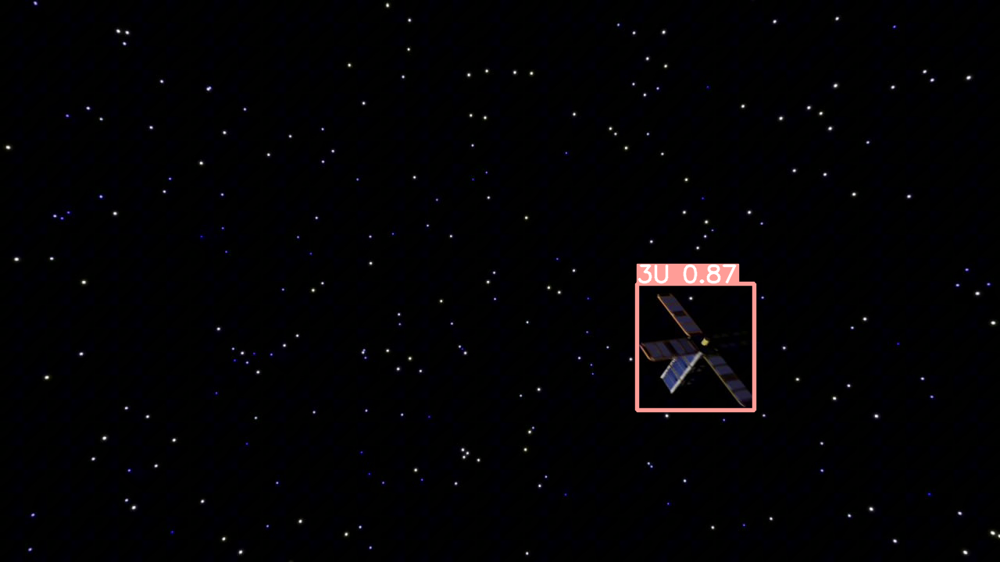


0: 640x640 1 3U, 9.3ms
Speed: 2.4ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 11.3ms
Speed: 5.3ms preprocess, 11.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.3ms
Speed: 2.3ms preprocess, 9.3ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.4ms
Speed: 2.2ms preprocess, 9.4ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.2ms preprocess, 9.5ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.3ms preprocess, 9.5ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.5ms
Speed: 2.2ms p

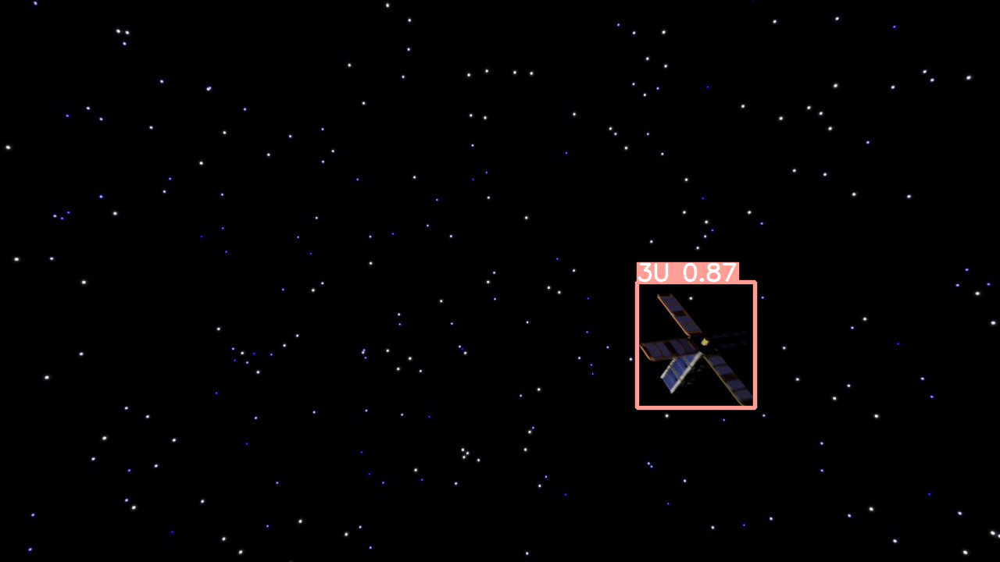


0: 640x640 1 3U, 9.1ms
Speed: 2.8ms preprocess, 9.1ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.5ms preprocess, 9.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.1ms preprocess, 9.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.6ms preprocess, 9.0ms inference, 2.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.3ms preprocess, 9.0ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 10.0ms
Speed: 2.2ms preprocess, 10.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 3U, 9.0ms
Speed: 2.2ms p

KeyboardInterrupt: 

In [ ]:
import cv2
from pathlib import Path
from ultralytics import YOLO
from google.colab.patches import cv2_imshow

def load_model(model_path):
    # تحميل النموذج المدرب مسبقًا باستخدام YOLOv8
    model = YOLO(model_path)
    return model

def detect_objects(model, source, name):
    # إذا كان المصدر فيديو
    if source.endswith(('mp4', 'avi', 'mov')):
        cap = cv2.VideoCapture(source)
        frame_width = int(cap.get(3))
        frame_height = int(cap.get(4))
        out = cv2.VideoWriter(f"{name}/output.avi", cv2.VideoWriter_fourcc(*'XVID'), 10, (frame_width, frame_height))

        frame_count = 0
        while True:
            ret, frame = cap.read()
            if not ret:
                break
            results = model(frame)
            result_frame = results[0].plot()  # إعادة صياغة النتائج باستخدام plot()
            out.write(result_frame)

            # حفظ وعرض كل 30 إطار (تقريباً كل ثانية)
            if frame_count % 30 == 0:
                cv2_imshow(result_frame)

            frame_count += 1

            # كسر الحلقة عند الضغط على مفتاح 'q'
            if cv2.waitKey(1) & 0xFF == ord('q'):
                break

        cap.release()
        out.release()
        cv2.destroyAllWindows()
        print(f"النتائج تم حفظها في الملف: {name}/output.avi")

if __name__ == "__main__":
    model_path = '/content/drive/MyDrive/yolov8-tensorrt/best.engine'  # path of trained model
    source = '/content/drive/MyDrive/yolov8-tensorrt/inference/test.mp4'  # path of video
    name = 'video'  # name of folder

    model = load_model(model_path)
    detect_objects(model, source, name)


In [ ]:
def detection("best.engine","inference/test.mp4",'detection'):
  # Check File Extension
  file_extension = pathlib.Path(model_path).suffix

  if(file_extension == ".engine"):
    model = AutoBackend(model_path, device=torch.device('cuda:0'), fp16=True)
    # Warmup
    model.warmup()
  else:
    model = YOLO(model_path)

SyntaxError: invalid syntax (<ipython-input-48-555346c1f431>, line 1)